# Master Thesis

By Estelle Danilo

### Table of Content

1- Reading the dataset \
&nbsp;&nbsp; a- number of records \
&nbsp;&nbsp; b- categorical vs numerical variable 

2- Feature engineering (converting to numerical or deriving numerical variables) \
&nbsp;&nbsp; a- day of week \
&nbsp;&nbsp; b- day of month \
&nbsp;&nbsp; c- month \
&nbsp;&nbsp; d- click through rate (click/impressions) \
&nbsp;&nbsp; e- five ad keywords (includes data splitting) 

3- EDA of each variable in training set \
&nbsp;&nbsp; a- time variables: day of week, day of month, month \
&nbsp;&nbsp; b- click through rate (click/impressions) \
&nbsp;&nbsp; c- five ad keywords \
&nbsp;&nbsp; d- accound id \
&nbsp;&nbsp; e- rank \
&nbsp;&nbsp; f- average bid 

4- Checking linear regression assumptions in training set \
&nbsp;&nbsp; a- Linearity test\
&nbsp;&nbsp; b- Multivariate normality of residuals \
&nbsp;&nbsp; c- No or little multicollinearity \
&nbsp;&nbsp; d- No auto-correlation of residuals \
&nbsp;&nbsp; e- Homoscedasticity: equal variance of residuals \
&nbsp;&nbsp; f- Expectation (mean) of residuals is zero  

5- Building linear & logistic regression models \
&nbsp;&nbsp; a- normalize features \
&nbsp;&nbsp; b- fit model + model accuracy \
&nbsp;&nbsp; c- interpret feature importance : bid price vs CTR 

6- Building a decision tree model \
&nbsp;&nbsp; a- regression tree \
&nbsp;&nbsp; b- classification tree 

7- Appendix


## 1 - Reading the dataset

In [2]:
import pandas as pd
import gzip
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image 
import pydotplus
from collections import Counter
import statsmodels.tsa.api as smt
import statsmodels.stats.api as sms
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy import stats
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics 
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO 
import imblearn
from imblearn import under_sampling
import mord as m

To increase default memory of jupyter notebook when running computationally expensive code: jupyter notebook --NotbookApp.iopub_Data_Rate_Limit=4e9

In [12]:
TextFileReader = pd.read_csv('yahoo_data.gz',
                             compression='gzip',
                             sep='\t',
                             header = None, 
                             error_bad_lines = False,
                             chunksize=10000, low_memory=False )  # chunksize is the number of rows per chunk

In [13]:
dfList = []
for df in TextFileReader:
    dfList.append(df)

In [14]:
df = pd.concat(dfList,sort=False)

In [15]:
df.head()

,0,1,2,3,4,5,6
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100.0,2.0,0.0
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100.0,1.0,0.0
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100.0,1.0,0.0
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100.0,2.0,0.0
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100.0,1.0,0.0


In [16]:
df.rename(columns = {0 : 'day', 1 : 'account_id', 2 : 'rank', 3 : 'five_keywords', 4 : 'avg_bid', 5 : 'impressions', 6 : 'clicks'}, inplace=True)

In [17]:
df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100.0,2.0,0.0
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100.0,1.0,0.0
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100.0,1.0,0.0
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100.0,2.0,0.0
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100.0,1.0,0.0


### &nbsp;&nbsp; a- number of records

In [18]:
len(df['account_id'])

77850272

the number of records (rows) is 77,850,272 

### &nbsp;&nbsp; b- categorical vs numerical variable

In [10]:
df.dtypes

day                int64
account_id        object
rank               int64
five_keywords     object
avg_bid          float64
impressions      float64
clicks           float64
dtype: object

In [33]:
pd.options.display.float_format = '{:,.0f}'.format #setting up precision level (number of decimal values = 0)

In [20]:
df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,2,0
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,2,0
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0


We have 
- continuous variables: day, rank, average bid price, number of impressions and clicks (all ranging from 1 to theoritically infinity)

- categorical variables: account id and keywords represented as strings

Given the data type of each variable, we will now transform them when necessary into meaningful numerical variables to be able to perform mathematical operations on them.
    

## 2- Feature engineering (converting to numerical or deriving numerical variable)

### &nbsp;&nbsp; a- day of week

> Extracting day of the week from the 'day' column

In [13]:
# we have 4 months worth of days ranging from day #1 to day #123
uniqday = df['day'].unique()
uniqday.sort()
print(uniqday)

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123]


Our goal is to create a list of all numbers of day that belong to the same day of the week, \
ie: day1, day2, day3, day4, day5, day6, day7, any of which could be a Monday. 

> Method 1: Creating groupings of same day of the week: brute-force method: exhaustively mapping each day

In [14]:
def generate_same_day_of_week(day):
    list_of_days = []
    list_of_days.append(day)
    while day < 117: #124(where day numbers stop)-7=117
        day += 7
        list_of_days.append(day)
    return(list_of_days)

In [15]:
list_of_day1 = generate_same_day_of_week(day=1)
print(list_of_day1)

[1, 8, 15, 22, 29, 36, 43, 50, 57, 64, 71, 78, 85, 92, 99, 106, 113, 120]


In [16]:
list_of_day2 = generate_same_day_of_week(day=2)
print(list_of_day2)

[2, 9, 16, 23, 30, 37, 44, 51, 58, 65, 72, 79, 86, 93, 100, 107, 114, 121]


In [17]:
list_of_day3 = generate_same_day_of_week(day=3)
print(list_of_day3)

[3, 10, 17, 24, 31, 38, 45, 52, 59, 66, 73, 80, 87, 94, 101, 108, 115, 122]


In [18]:
list_of_day4 = generate_same_day_of_week(day=4)
print(list_of_day4)

[4, 11, 18, 25, 32, 39, 46, 53, 60, 67, 74, 81, 88, 95, 102, 109, 116, 123]


In [19]:
list_of_day5 = generate_same_day_of_week(day=5)
print(list_of_day5)

[5, 12, 19, 26, 33, 40, 47, 54, 61, 68, 75, 82, 89, 96, 103, 110, 117]


In [20]:
list_of_day6 = generate_same_day_of_week(day=6)
print(list_of_day6)

[6, 13, 20, 27, 34, 41, 48, 55, 62, 69, 76, 83, 90, 97, 104, 111, 118]


In [21]:
list_of_day7 = generate_same_day_of_week(day=7)
print(list_of_day7)

[7, 14, 21, 28, 35, 42, 49, 56, 63, 70, 77, 84, 91, 98, 105, 112, 119]


> Method 2: Creating the day of week column based on groupings: more efficient method: use the % (remainder sign)

In [22]:
16%7 #the 16th day divided by what and it remains 7 (the number of days in a week) #result is 2

2

In [21]:
df['day_of_week'] = np.where(df['day']%7 == 1, 1,
                            np.where(df['day']%7 == 2, 2,
                            np.where(df['day']%7 == 3, 3,
                            np.where(df['day']%7 == 4, 4,
                            np.where(df['day']%7 == 5, 5,
                            np.where(df['day']%7 == 6, 6,
                            np.where(df['day']%7 == 0, 7, np.nan)))))))

In [22]:
df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,2,0,1
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,2,0,4
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,6


### &nbsp;&nbsp; b- day (and week) of month

In [24]:
#day of month
todayofmonth = lambda x: x % 31 #31 days on average in a month

In [25]:
df['day_of_month'] = todayofmonth(df['day'])

In [26]:
df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,2,0,1,1
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,2,0,4,11
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,6,14


In [28]:
#range of day of month:
df['day_of_month'].min()

0

In [29]:
df['day_of_month'].max()

30

In [27]:
df['week_of_month'] = np.where(df['day_of_month'].isin(range(0,7)), 1,
                            np.where(df['day_of_month'].isin(range(7,14)), 2,
                            np.where(df['day_of_month'].isin(range(14,21)), 3,
                            np.where(df['day_of_month'].isin(range(21,28)), 4,
                            np.where(df['day_of_month'].isin(range(28,31)), 5, np.nan)))))

In [29]:
df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,2,0,1,1,1
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29,5
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29,5
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,2,0,4,11,2
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,6,14,3


### &nbsp;&nbsp; c- month 

In [32]:
max(df['day'])

123

In [33]:
123/4

30.75

about 31 days per month

In [30]:
df['month'] = np.where(df['day'].isin(range(1,32)), 1,      
                            np.where(df['day'].isin(range(32,62)), 2, 
                            np.where(df['day'].isin(range(62,92)), 3, 
                            np.where(df['day'].isin(range(92,124)), 4, np.nan)))) 

In [31]:
df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month,month
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,2,0,1,1,1,1
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29,5,1
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29,5,1
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,2,0,4,11,2,1
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,6,14,3,3


### &nbsp;&nbsp; d- click through rate (click/impressions)

In [32]:
df['click_through_rate'] = df['clicks']/df['impressions']

### &nbsp;&nbsp; e- five ad keywords


This variable is a categorical feature with high cardinality (many levels/can take on many values). 

In [37]:
keywords = pd.read_csv('keyphrase-category.txt', sep=" ", header=None)

In [38]:
len(keywords[0].unique())

75359

In [39]:
len(df['five_keywords'].unique())

648515

To convert the variable to a numeric type, we could create 1 binary variables that represent whether the exact list of keywords is present (one hot encoding). However, we consider that the order in which the keywords appear in the list is not meaningful and there are far fewer unique possible keywords (75359) than unique possible combinations of 5 keywords (648515), therefore we decide to break down this single binary variable into its keywords components: 75359 binary variables. 

We now have the problems that there are far too many binary variables to be included in our future model for our model to be easily interpretable. Therefore, we decide to group some levels by frequency.

First, we need to parse the string of 5 keywords into 5 strings of keywords

In [40]:
df['five_keywords'].unique()[0]

'2affa525151b6c51 79021a2e2c836c1a 327e089362aac70c fca90e7f73f3c8ef af26d27737af376a'

In [41]:
df['five_keywords'].unique()[0].split()

['2affa525151b6c51',
 '79021a2e2c836c1a',
 '327e089362aac70c',
 'fca90e7f73f3c8ef',
 'af26d27737af376a']

Method 1: Grouping categories with similar frequency: Leave a certain number of most frequent categories as is and group the remaining categories as one, given that their frequency is similar. 

What are the most frequent unique keywords?

Computing most frequent keywords with their corresponding frequency:

In [42]:
listkeywords = []

In [43]:
main_cnt = Counter()
for idx,keyword in enumerate(df['five_keywords']):
    if idx % 1000000 == 0 and idx != 0: print(f'At {idx} row')
    listkeywords.extend(keyword.split())
    if idx!=0 and idx % 10000000 == 0:
        main_cnt += Counter(listkeywords)
        listkeywords.clear()

At 1000000 row
At 2000000 row
At 3000000 row
At 4000000 row
At 5000000 row
At 6000000 row
At 7000000 row
At 8000000 row
At 9000000 row
At 10000000 row
At 11000000 row
At 12000000 row
At 13000000 row
At 14000000 row
At 15000000 row
At 16000000 row
At 17000000 row
At 18000000 row
At 19000000 row
At 20000000 row
At 21000000 row
At 22000000 row
At 23000000 row
At 24000000 row
At 25000000 row
At 26000000 row
At 27000000 row
At 28000000 row
At 29000000 row
At 30000000 row
At 31000000 row
At 32000000 row
At 33000000 row
At 34000000 row
At 35000000 row
At 36000000 row
At 37000000 row
At 38000000 row
At 39000000 row
At 40000000 row
At 41000000 row
At 42000000 row
At 43000000 row
At 44000000 row
At 45000000 row
At 46000000 row
At 47000000 row
At 48000000 row
At 49000000 row
At 50000000 row
At 51000000 row
At 52000000 row
At 53000000 row
At 54000000 row
At 55000000 row
At 56000000 row
At 57000000 row
At 58000000 row
At 59000000 row
At 60000000 row
At 61000000 row
At 62000000 row
At 63000000 row
A

In [44]:
f'Number of unique keywords: {len(main_cnt)}' 

'Number of unique keywords: 72041'

In [45]:
main_cnt.most_common(7)

[('79021a2e2c836c1a', 19881518),
 ('cd74a8342d25d090', 17723160),
 ('3db691494440189b', 15371807),
 ('aef4ee042bea9c6b', 11268583),
 ('fc4f04e287746c48', 11056736),
 ('de84da9dfd5a336d', 6305274),
 ('ac26bfe54a8a8f38', 2214239)]

Plotting the distribution of top 50 frequencies to identify how many keyword variables to keep in order to remain the most representative of the diversity in keywords

In [46]:
indexes = [row[0] for row in main_cnt.most_common(50)]
indexes_as_number = range(1,51)

In [47]:
values = [row[1] for row in main_cnt.most_common(50)]

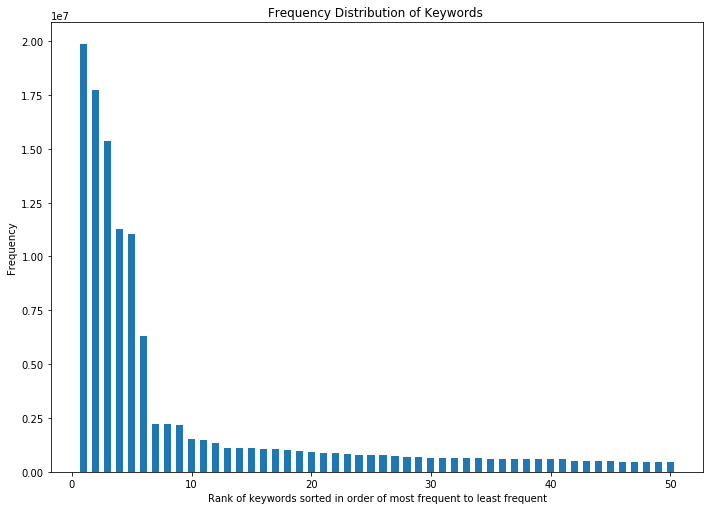

In [48]:
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
width = 0.6
plt.bar(indexes_as_number, values, width)
plt.title('Frequency Distribution of Top 50 Keywords ')
plt.xlabel('Rank of keywords sorted in order of most frequent to least frequent')
plt.ylabel('Frequency')
plt.show()

We notice that after the 6th most frequent keywords, the remaining keywords' frequency remains in similar order of magnitude.


We therefore decide to leave the 6 most frequent categories as is and group the remaining categories as one, given that their frequency is similar.

But let's check that these 6 most frequent keywords hold constant when we only use pour training data consisting of 80% of the full dataset, because we want to recode the keyword variable in a way that is not informed by the test set. 

In [172]:
##when keeping full data
train_df, test_df = train_test_split(df, test_size=0.2, random_state = 5) #random_state for reproducability

In [173]:
train_df.shape

(62280217, 19)

In [254]:
test_df.shape

(15570055, 19)

In [174]:
#recomputing frequency only using training set
listkeywords2 = []

In [175]:
main_cnt2 = Counter()
for idx,keyword in enumerate(train_df['five_keywords']):
    if idx % 1000000 == 0 and idx != 0: print(f'At {idx} row')
    listkeywords2.extend(keyword.split())
    if idx!=0 and idx % 10000000 == 0:
        main_cnt2 += Counter(listkeywords2)
        listkeywords2.clear()

At 1000000 row
At 2000000 row
At 3000000 row
At 4000000 row
At 5000000 row
At 6000000 row
At 7000000 row
At 8000000 row
At 9000000 row
At 10000000 row
At 11000000 row
At 12000000 row
At 13000000 row
At 14000000 row
At 15000000 row
At 16000000 row
At 17000000 row
At 18000000 row
At 19000000 row
At 20000000 row
At 21000000 row
At 22000000 row
At 23000000 row
At 24000000 row
At 25000000 row
At 26000000 row
At 27000000 row
At 28000000 row
At 29000000 row
At 30000000 row
At 31000000 row
At 32000000 row
At 33000000 row
At 34000000 row
At 35000000 row
At 36000000 row
At 37000000 row
At 38000000 row
At 39000000 row
At 40000000 row
At 41000000 row
At 42000000 row
At 43000000 row
At 44000000 row
At 45000000 row
At 46000000 row
At 47000000 row
At 48000000 row
At 49000000 row
At 50000000 row
At 51000000 row
At 52000000 row
At 53000000 row
At 54000000 row
At 55000000 row
At 56000000 row
At 57000000 row
At 58000000 row
At 59000000 row
At 60000000 row
At 61000000 row
At 62000000 row


In [176]:
indexes = [row[0] for row in main_cnt2.most_common(50)]
indexes_as_number = range(1,51)

In [177]:
values = [row[1] for row in main_cnt2.most_common(50)]

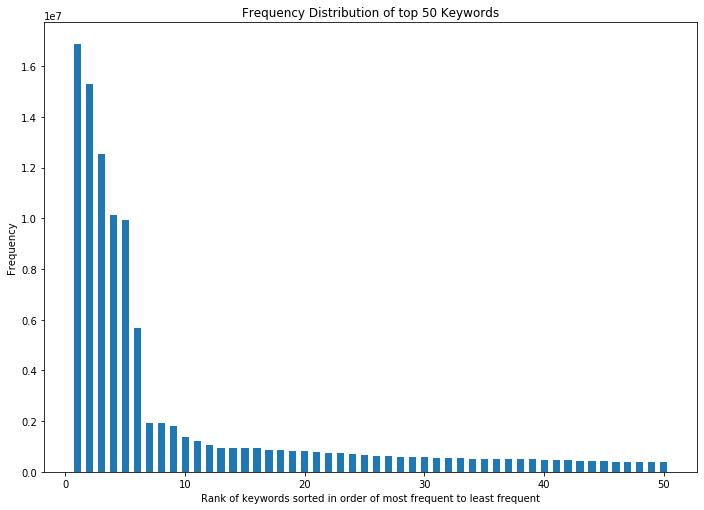

In [263]:
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
width = 0.6
plt.bar(indexes_as_number, values, width)
plt.title('Frequency Distribution of top 50 Keywords')
plt.xlabel('Rank of keywords sorted in order of most frequent to least frequent')
plt.ylabel('Frequency')
plt.show()

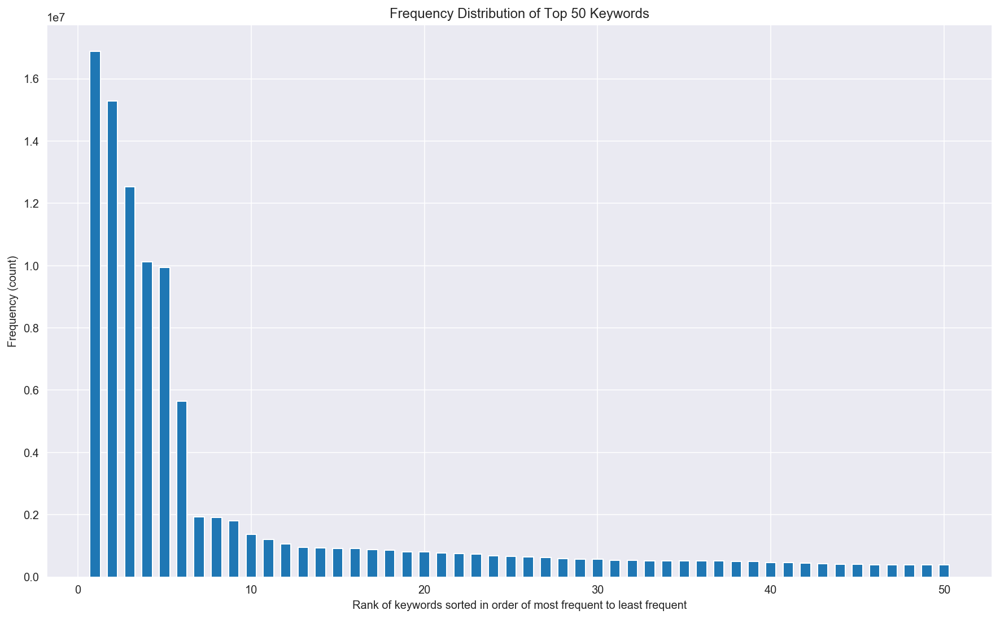

In [179]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
width = 0.6
plt.bar(indexes_as_number, values, width)
plt.title('Frequency Distribution of Top 50 Keywords')
plt.xlabel('Rank of keywords sorted in order of most frequent to least frequent')
plt.ylabel('Frequency (count)')
plt.show()

the previous 6 most frequent keywords we had were:
- keyword_79021a2e2c836c1a
- keyword_cd74a8342d25d090
- keyword_3db691494440189b
- keyword_aef4ee042bea9c6b
- keyword_fc4f04e287746c48
- keyword_de84da9dfd5a336d

In the training data below, we notice that the 6 most frequent keywords are the same:

In [264]:
main_cnt2.most_common(6)

[('79021a2e2c836c1a', 16886165),
 ('cd74a8342d25d090', 15289613),
 ('3db691494440189b', 12534907),
 ('aef4ee042bea9c6b', 10119765),
 ('fc4f04e287746c48', 9943003),
 ('de84da9dfd5a336d', 5653821)]

Therefore, we can be confident that the keyword frequency patterns we observed in the full data still hold in the training data. 

- for 1st keyword 79021a2e2c836c1a : 

In [38]:
keyword_79021a2e2c836c1a = []

for idx,keyword in enumerate(df['five_keywords']):
    if idx % 10000000 == 0 : print(f'At {idx} row')
    if '79021a2e2c836c1a' in keyword:
        keyword_79021a2e2c836c1a.append(1) #create & populate a new column using index row number
    else:
        keyword_79021a2e2c836c1a.append(0)

At 0 row
At 10000000 row
At 20000000 row
At 30000000 row
At 40000000 row
At 50000000 row
At 60000000 row
At 70000000 row


In [39]:
df['keyword_79021a2e2c836c1a'] = keyword_79021a2e2c836c1a

In [51]:
df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month,month,click_through_rate,keyword_79021a2e2c836c1a
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,2,0,1,1,1,1,0,1
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29,5,1,0,0
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29,5,1,0,0
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,2,0,4,11,2,1,0,0
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,6,14,3,3,0,0


- for 2nd keyword cd74a8342d25d090 : 

In [40]:
keyword_cd74a8342d25d090 = []

for idx,keyword in enumerate(df['five_keywords']):
    if idx % 10000000 == 0 : print(f'At {idx} row')
    if 'cd74a8342d25d090' in keyword:
        keyword_cd74a8342d25d090.append(1) #create & populate a new column using index row number
    else:
        keyword_cd74a8342d25d090.append(0)

At 0 row
At 10000000 row
At 20000000 row
At 30000000 row
At 40000000 row
At 50000000 row
At 60000000 row
At 70000000 row


In [41]:
df['keyword_cd74a8342d25d090'] = keyword_cd74a8342d25d090

- for 3rd keyword 3db691494440189b : 

In [42]:
keyword_3db691494440189b = []

for idx,keyword in enumerate(df['five_keywords']):
    if idx % 10000000 == 0 : print(f'At {idx} row')
    if '3db691494440189b' in keyword:
        keyword_3db691494440189b.append(1) #create & populate a new column using index row number
    else:
        keyword_3db691494440189b.append(0)

At 0 row
At 10000000 row
At 20000000 row
At 30000000 row
At 40000000 row
At 50000000 row
At 60000000 row
At 70000000 row


In [43]:
df['keyword_3db691494440189b'] = keyword_3db691494440189b

- for 4th keyword aef4ee042bea9c6b : 

In [44]:
keyword_aef4ee042bea9c6b = []

for idx,keyword in enumerate(df['five_keywords']):
    if idx % 10000000 == 0 : print(f'At {idx} row')
    if 'aef4ee042bea9c6b' in keyword:
        keyword_aef4ee042bea9c6b.append(1) #create & populate a new column using index row number
    else:
        keyword_aef4ee042bea9c6b.append(0)

At 0 row
At 10000000 row
At 20000000 row
At 30000000 row
At 40000000 row
At 50000000 row
At 60000000 row
At 70000000 row


In [45]:
df['keyword_aef4ee042bea9c6b'] = keyword_aef4ee042bea9c6b

- for 5th keyword fc4f04e287746c48 : 

In [46]:
keyword_fc4f04e287746c48 = []

for idx,keyword in enumerate(df['five_keywords']):
    if idx % 10000000 == 0 : print(f'At {idx} row')
    if 'fc4f04e287746c48' in keyword:
        keyword_fc4f04e287746c48.append(1) #create & populate a new column using index row number
    else:
        keyword_fc4f04e287746c48.append(0)

At 0 row
At 10000000 row
At 20000000 row
At 30000000 row
At 40000000 row
At 50000000 row
At 60000000 row
At 70000000 row


In [47]:
df['keyword_fc4f04e287746c48'] = keyword_fc4f04e287746c48

- for 6th keyword de84da9dfd5a336d : 

In [48]:
keyword_de84da9dfd5a336d = []

for idx,keyword in enumerate(df['five_keywords']):
    if idx % 10000000 == 0 : print(f'At {idx} row')
    if 'de84da9dfd5a336d' in keyword:
        keyword_de84da9dfd5a336d.append(1) #create & populate a new column using index row number
    else:
        keyword_de84da9dfd5a336d.append(0)

At 0 row
At 10000000 row
At 20000000 row
At 30000000 row
At 40000000 row
At 50000000 row
At 60000000 row
At 70000000 row


In [49]:
df['keyword_de84da9dfd5a336d'] = keyword_de84da9dfd5a336d

- for all the remaining keywords : 

In [50]:
keyword_remaining = []

mostfrequentkeywords = ['79021a2e2c836c1a','cd74a8342d25d090','3db691494440189b','aef4ee042bea9c6b','fc4f04e287746c48', 'de84da9dfd5a336d']

for idx,keyword in enumerate(df['five_keywords']):
    if idx % 10000000 == 0 : print(f'At {idx} row')
    if (mostfrequentkeywords[0] in keyword or mostfrequentkeywords[1] in keyword or mostfrequentkeywords[2] in keyword or
       mostfrequentkeywords[3] in keyword or mostfrequentkeywords[4] in keyword or mostfrequentkeywords[5] in keyword):
        keyword_remaining.append(0) # top 6 most frequent keywords
    else:
        keyword_remaining.append(1) # remaining keywords

At 0 row
At 10000000 row
At 20000000 row
At 30000000 row
At 40000000 row
At 50000000 row
At 60000000 row
At 70000000 row


In [51]:
df['keyword_remaining'] = keyword_remaining

In [266]:
df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_fc4f04e287746c48,keyword_de84da9dfd5a336d,keyword_remaining
0,1,08bade48-1081-488f-b459-6c75d75312ae,2,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,2,0,1,1,1,1,0,1,0,0,0,0,0,0
1,29,08bade48-1081-488f-b459-6c75d75312ae,3,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29,5,1,0,0,1,0,0,0,0,0
2,29,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,1,29,5,1,0,0,1,0,0,0,0,0
3,11,08bade48-1081-488f-b459-6c75d75312ae,1,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,2,0,4,11,2,1,0,0,1,0,0,0,0,0
4,76,08bade48-1081-488f-b459-6c75d75312ae,2,769ed4a87b5010f4 3d4b990abb0867c8 cd74a8342d25...,100,1,0,6,14,3,3,0,0,1,0,0,0,0,0


Method 2: clustering the categories of the variables based on the response. Given the size of the data, we do not pursue this method.

Code sample for clustering:

from sklearn.cluster import KMeans \
import numpy as np\
X = np.array([[1, 2], [1, 4], [1, 0], [10, 2], [10, 4], [10, 0]]) \
kmeans = KMeans(n_clusters=2, random_state=0).fit(X) \
kmeans.labels_

Method 3: As an alternative to the frequency grouping we just did, we could create 5 features, each target encoding one of the 5 keywords. Target encoding means replacing each category (level) in a variable with the mean response (rank in auction) given that category.

## 3- EDA of each variable : 

Univariate statistics:
- missing values 
- frequency distribution: count & proportion per unique values
- summary statistics

Bivariate statistics:
- relation between each variable and target variable rank
- relation between each variable and feature of interest clicks
- relation between each variable and feature of interest impressions
- relation between each variable and feature of interest CTR
- relation between each variable and feature of interest bid price

- mean ctr,click,impression,bid price per variable

### Data Splitting from before with all features added after keywords

In [19]:
subdf = df.sample(n=10000000, random_state = 5)

In [20]:
#redoing data splitting to add the feature engineered variables
train_df, test_df = train_test_split(subdf, test_size=0.2, random_state = 5) #random_state for reproducability

In [58]:
train_df.head()

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_fc4f04e287746c48,keyword_de84da9dfd5a336d,keyword_remaining
32145562,73,85e63b20-2693-4f06-abe5-aca3a5684449,6,15e40fe4dc72c5f9 db4729d363a51a34 79021a2e2c83...,150,1,0,3,11,2,3,0,1,0,0,0,0,0,0
19264239,122,3872871f-de3f-4ada-8e70-65d547dac78f,10,79021a2e2c836c1a fe03ec6e7ddd8344,300,1,0,3,29,5,4,0,1,0,0,0,0,0,0
74277694,23,84f574b9-8f4b-4e54-beb8-99995ec060b6,2,aef4ee042bea9c6b a94a9c91b7a9f7e4 fc4f04e28774...,"2,000",5,0,2,23,4,1,0,0,0,0,1,1,0,0
54332795,36,28c9f1e1-0b4f-4bcd-97e6-57a7313fe147,7,c4913cff535cdc76 9ae15116a91320a6 79021a2e2c83...,450,1,0,1,5,1,2,0,1,0,0,0,0,0,0
46896331,6,4dc48568-b115-4c38-8b21-9d39789d6484,1,95a24f5bf57efe7c 22c154eec28333fb 3db691494440...,810,5,0,6,6,1,1,0,0,0,1,0,0,0,0


In [ ]:
train_df.shape

### Diagnosing no missing values:

In [265]:
train_df.isnull().sum()

day                         0
account_id                  0
rank                        0
five_keywords               0
avg_bid                     0
impressions                 0
clicks                      0
day_of_week                 0
day_of_month                0
week_of_month               0
month                       0
click_through_rate          0
keyword_79021a2e2c836c1a    0
keyword_cd74a8342d25d090    0
keyword_3db691494440189b    0
keyword_aef4ee042bea9c6b    0
keyword_fc4f04e287746c48    0
keyword_de84da9dfd5a336d    0
keyword_remaining           0
dtype: int64

### &nbsp;&nbsp; a- time variables: day of week, day of month, month

In [ ]:
# univariate stats not meaningful but bivariate is 

a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
plt.title('Frequency Distribution of keywords')
sns.set(style="whitegrid")

#relation between [day,week,month] and click: boxplot
#relation between [day,week,month] and impression: boxplot
#relation between [day,week,month] and ctr: boxplot
#relation between [day,week,month] and rank: boxplot
#relation between [day,week,month] and bid price: boxplot

#mean ctr,click,impression,bid price per time: table



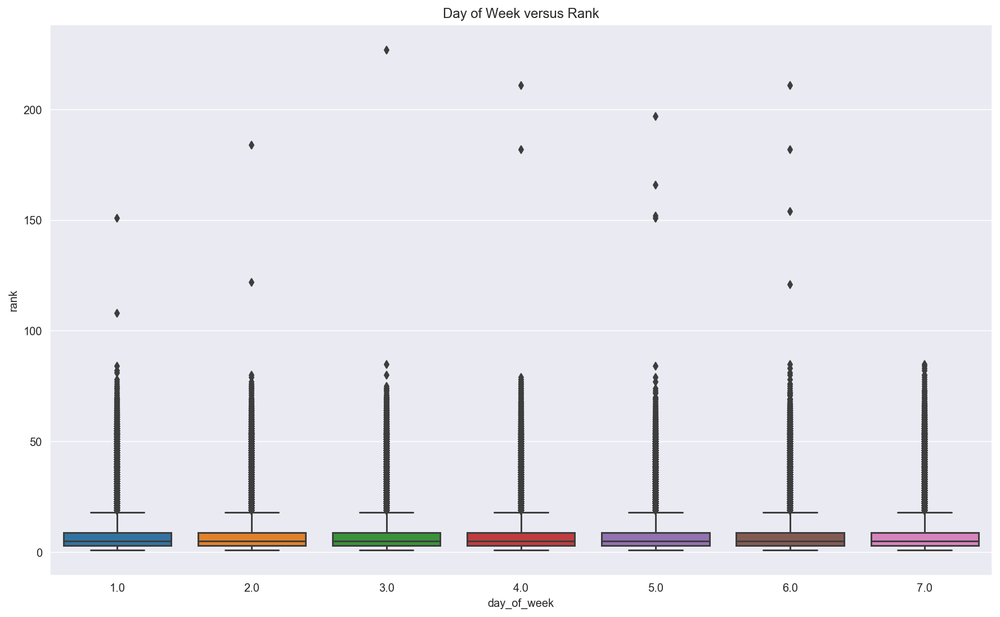

In [24]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Day of Week versus Rank') 
sns.boxplot(x= "day_of_week", y= "rank", data=train_df) #palette='hls'

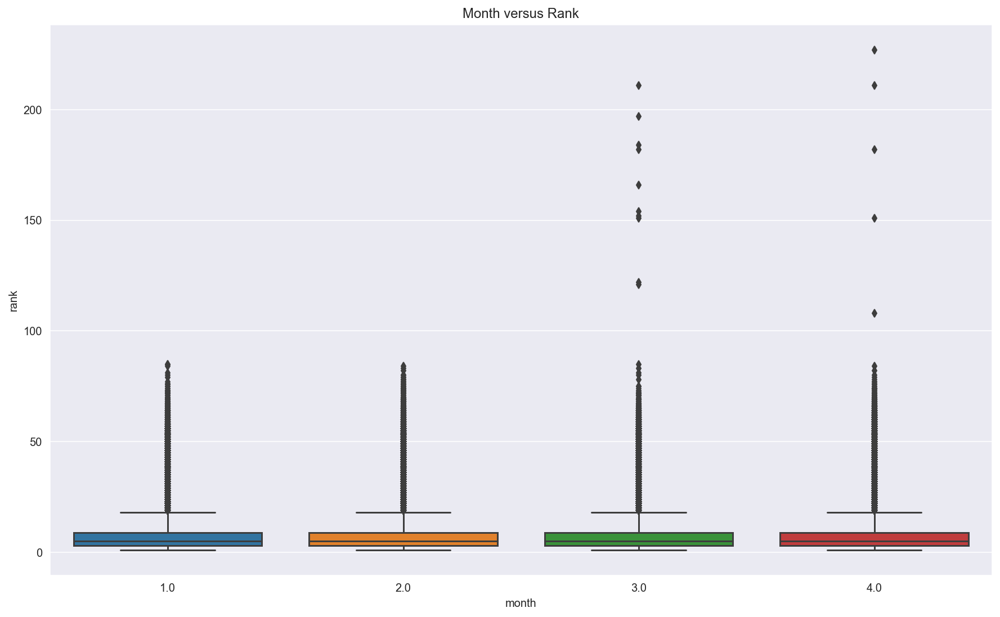

In [27]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Month versus Rank') 
sns.boxplot(x= "month", y= "rank", data=train_df)

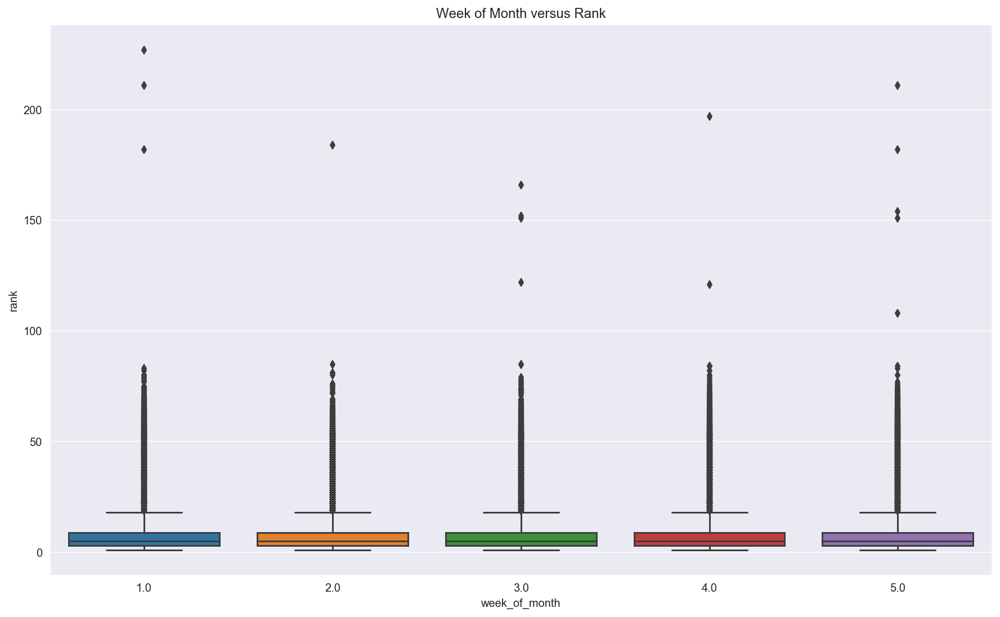

In [25]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Week of Month versus Rank') 
sns.boxplot(x= "week_of_month", y= "rank", data=train_df)

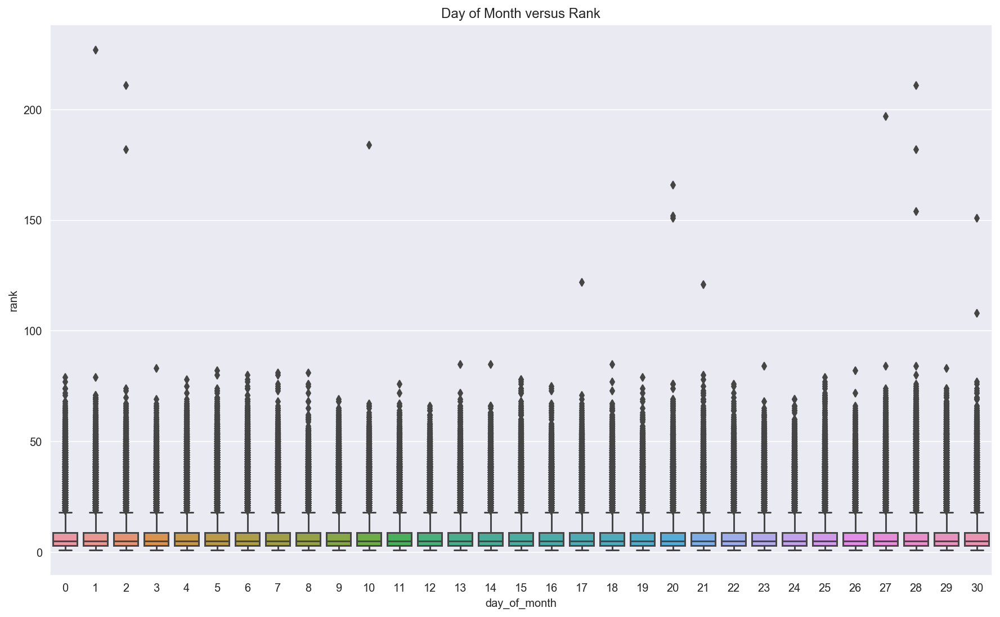

In [26]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Day of Month versus Rank') 
sns.boxplot(x= "day_of_month", y= "rank", data=train_df)

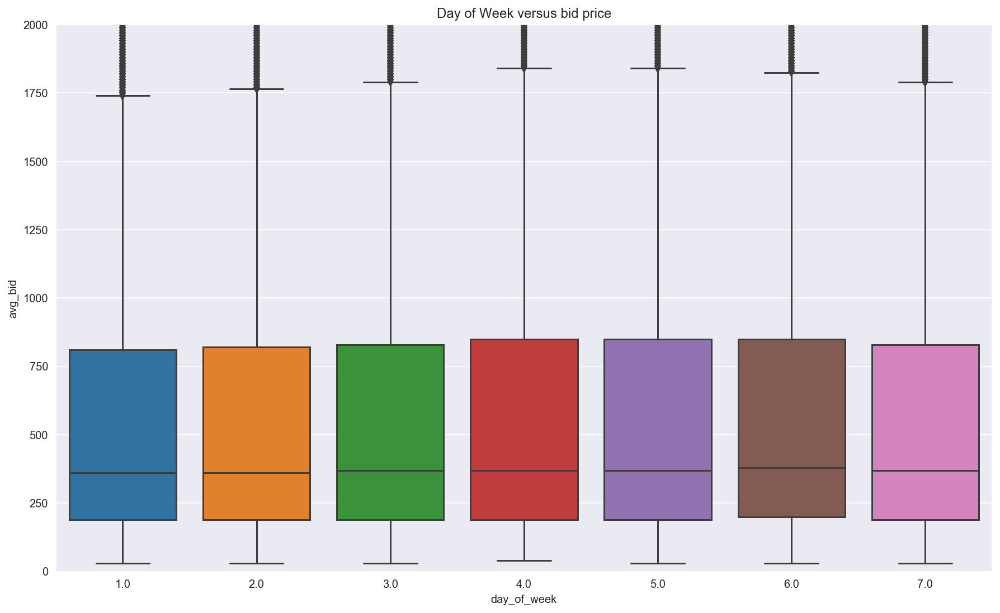

In [77]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.ylim(0, 2000)
plt.title('Day of Week versus bid price') 
sns.boxplot(x= "day_of_week", y= "avg_bid", data=train_df)

### &nbsp;&nbsp; b- click through rate (click/impressions)

> clicks

In [ ]:
#frequency distribution: proportion
train_df['clicks'].value_counts()/len(train_df['clicks'])

In [ ]:
#frequency distribution: count
train_df['clicks'].value_counts()

To analyze the distribution of clicks, given that many clicks=0 and that the few clicks that are not 0 take on a wide range of values, we visualize the frequency as a binary (whether or not clicks = 0), as opposed to clicks as a range of numbers. 

In [ ]:
train_df['Number_of_Clicks'] = np.where(train_df['clicks'] == 0, '0', '>0')

In [ ]:
#frequency distribution: count

a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
plt.title('Frequency Distribution of Clicks') #or of CTR
sns.set(style="whitegrid")
sns.countplot(x= "Number_of_Clicks",data=train_df, palette='hls')

In [ ]:
#frequency distribution: proportion
train_df['Number_of_Clicks'].value_counts()/len(train_df['Number_of_Clicks'])

There is 4% of the data that contains at least 1 click on an ad : a click is therefore a rare event
that occurs in only 3,719,737 of the records:

In [ ]:
sum(df['clicks'] > 0)

In [ ]:
#summary statistics: max, min, average, sd
df['clicks'].describe()

In [ ]:
#relation between clicks and impressions: scatterplot
ax = sns.scatterplot(x="total_bill", y="tip", data=tips)

In [ ]:
#relation between clicks and ranks: scatterplot/barplot
ax = sns.scatterplot(x="total_bill", y="tip", data=tips)

In [ ]:
#relation between clicks and bid price: scatterplot
ax = sns.scatterplot(x="total_bill", y="tip", data=tips)

In [ ]:
#mean impression,bid price per clicks: table
ax = sns.scatterplot(x="total_bill", y="tip", data=tips)

> impressions

In [ ]:
#frequency distribution: proportion
train_df['impressions'].value_counts()/len(train_df['impressions'])

In [ ]:
#frequency distribution: count
train_df['impressions'].value_counts()

In [ ]:
#frequency distribution: count
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
plt.title('Relation between impressions and rank') 
sns.set(style="whitegrid")
sns.countplot(x= "impressions",data=train_df, palette='hls')

In [ ]:
#number of unique values
df['impressions'].astype(int).unique()

In [ ]:
#summary statistics: max, min, average, sd
df['impressions'].describe()

In [ ]:
#relation between impressions and ctr: scatterplot
#relation between impressions and rank: scatterplot/barplot
#relation between impressions and bid price: scatterplot

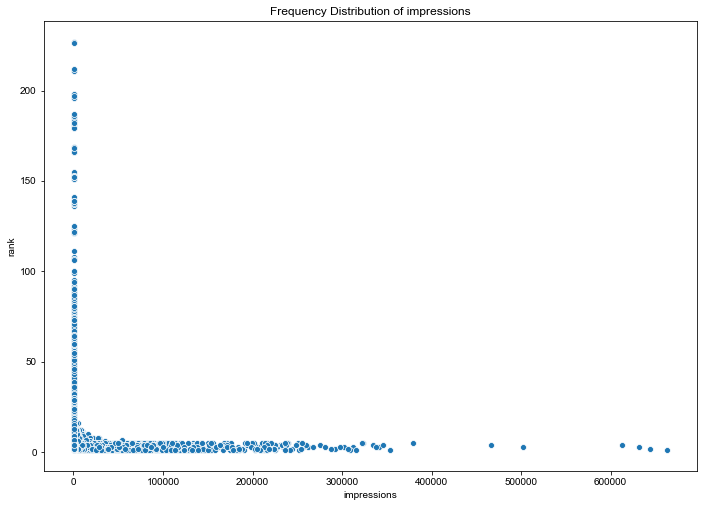

In [9]:
#relation between impressions and rank: scatterplot
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
plt.title('Frequency Distribution of impressions') 
sns.set(style="whitegrid")
sns.scatterplot(x= "impressions", y= "rank", data=train_df, palette='hls')

In [ ]:
#mean bid price per impressions: table

> click through rate

In [ ]:
#frequency distribution: proportion
train_df['click_through_rate'].value_counts()/len(train_df['click_through_rate'])

In [ ]:
#frequency distribution: count
train_df['click_through_rate'].value_counts()

In [ ]:
#frequency distribution: count
#maybe need to log to see better the boxplots
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
#sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Frequency Distribution of click through rate') 
sns.countplot(x= "click_through_rate", data=train_df) # palette='hls'

In [37]:
#number of unique values
df['click_through_rate'].unique()[0:10]

array([0.        , 1.        , 0.125     , 0.66666667, 0.03571429,
       0.05555556, 0.07142857, 0.1       , 0.08333333, 0.01190476])

In [35]:
pd.options.display.float_format = '{:,.3f}'.format #setting up precision level (number of decimal values = 0)

In [38]:
#summary statistics: max, min, average, sd
df['click_through_rate'].describe()

count   77,850,272.000
mean             0.012
std              0.087
min              0.000
25%              0.000
50%              0.000
75%              0.000
max              7.000
Name: click_through_rate, dtype: float64

In [ ]:
#relation between ctr and rank: scatterplot/bar

#relation between ctr and bid price: scatterplot

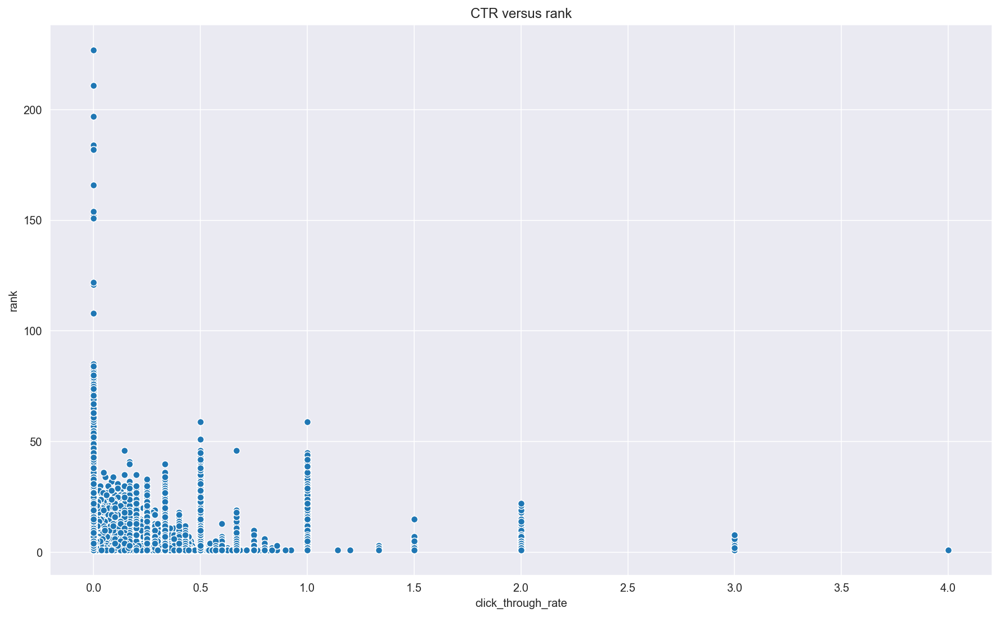

In [42]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('CTR versus rank') 
sns.scatterplot(x= "click_through_rate", y= "rank", data=train_df)

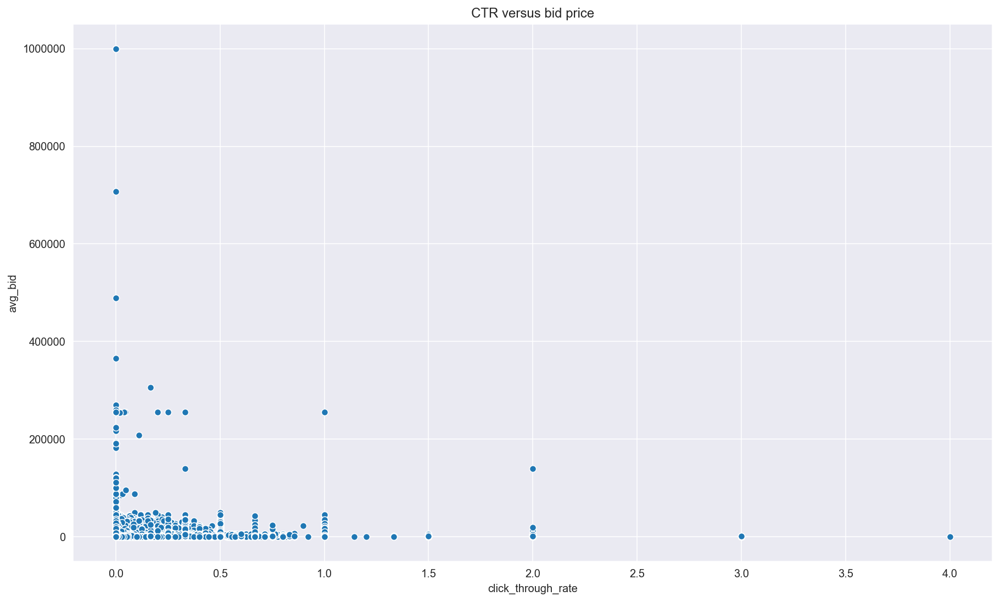

In [44]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('CTR versus bid price') 
sns.scatterplot(x= "click_through_rate", y= "avg_bid", data=train_df)

In [ ]:
#mean bid price per ctr: table

### &nbsp;&nbsp; c- five ad keywords 

7 binary categories:
- keyword_79021a2e2c836c1a
- keyword_cd74a8342d25d090
- keyword_3db691494440189b
- keyword_aef4ee042bea9c6b
- keyword_fc4f04e287746c48
- keyword_de84da9dfd5a336d
- keyword_remaining

In [47]:
#frequency distribution: count & proportion of each keyword in the dataset: barplot
list_of_keywords = ['keyword_79021a2e2c836c1a','keyword_cd74a8342d25d090','keyword_3db691494440189b',
                   'keyword_aef4ee042bea9c6b','keyword_fc4f04e287746c48','keyword_de84da9dfd5a336d','keyword_remaining']

listofcounts = []

for key in list_of_keywords:
    print('count of : '+ str(key) + ' : ' + str(sum(train_df[key])))
    print('proportion of : '+ str(key) + ' : ' + str(sum(train_df[key])/len(train_df[key])))
    listofcounts.append(sum(train_df[key]))

count of : keyword_79021a2e2c836c1a : 2249400
proportion of : keyword_79021a2e2c836c1a : 0.281175
count of : keyword_cd74a8342d25d090 : 2035021
proportion of : keyword_cd74a8342d25d090 : 0.254377625
count of : keyword_3db691494440189b : 1661171
proportion of : keyword_3db691494440189b : 0.207646375
count of : keyword_aef4ee042bea9c6b : 1335005
proportion of : keyword_aef4ee042bea9c6b : 0.166875625
count of : keyword_fc4f04e287746c48 : 1313685
proportion of : keyword_fc4f04e287746c48 : 0.164210625
count of : keyword_de84da9dfd5a336d : 752746
proportion of : keyword_de84da9dfd5a336d : 0.09409325
count of : keyword_remaining : 0
proportion of : keyword_remaining : 0.0


In [52]:
list_of_keywords = ['79021a2e2c836c1a','cd74a8342d25d090','3db691494440189b',
                   'aef4ee042bea9c6b','fc4f04e287746c48','de84da9dfd5a336d','keyword_remaining']


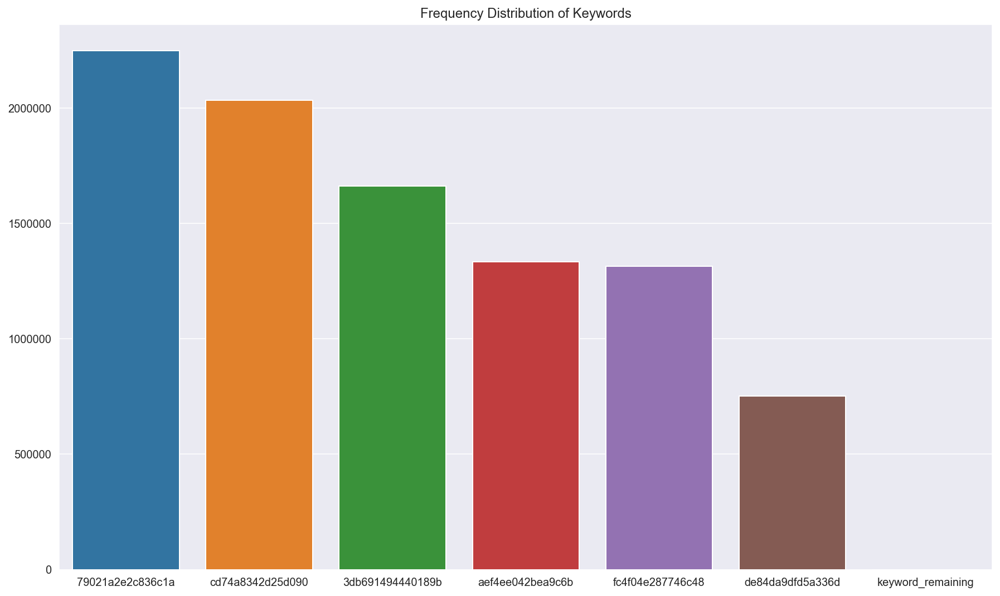

In [56]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Frequency Distribution of Keywords')
ax = sns.barplot(x=list_of_keywords, y=listofcounts)

In [ ]:
#relation between keyword and click: boxplot

In [ ]:
#relation between keyword and impression: boxplot

In [ ]:
#relation between keyword and ctr: boxplot

In [ ]:
#relation between keyword and rank: boxplot

In [ ]:
#relation between keyword and bid price: boxplot

In [ ]:
#mean ctr,click,impression,bid price per keyword: table

In [ ]:
list_of_keywords = ['keyword_79021a2e2c836c1a','keyword_cd74a8342d25d090','keyword_3db691494440189b',
                   'keyword_aef4ee042bea9c6b','keyword_fc4f04e287746c48','keyword_de84da9dfd5a336d','keyword_remaining']


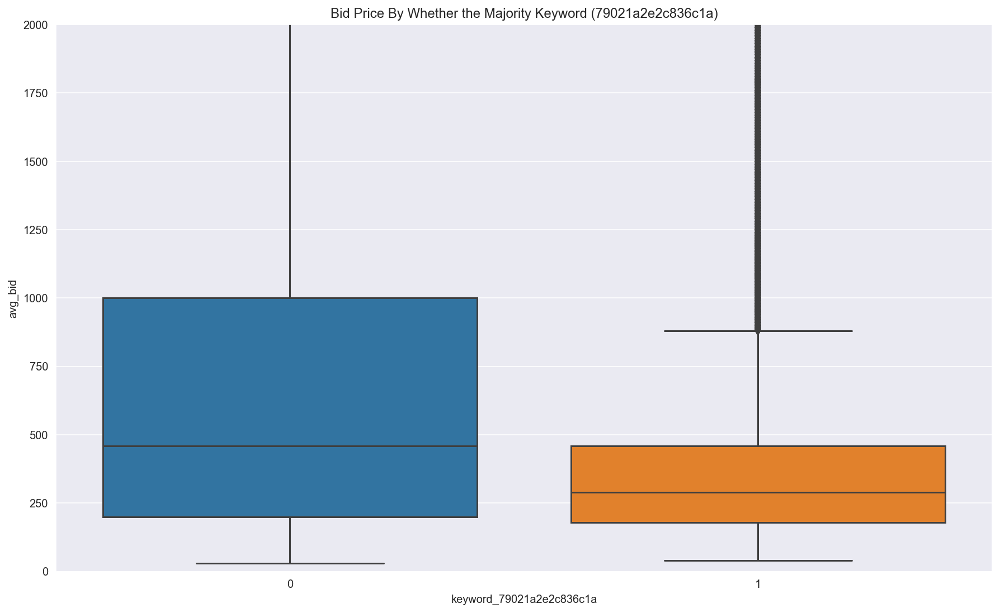

In [69]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Bid Price By Whether the Majority Keyword (79021a2e2c836c1a)') 
plt.ylim(0, 2000)
sns.boxplot(x= "keyword_79021a2e2c836c1a", y= "avg_bid", data=train_df)

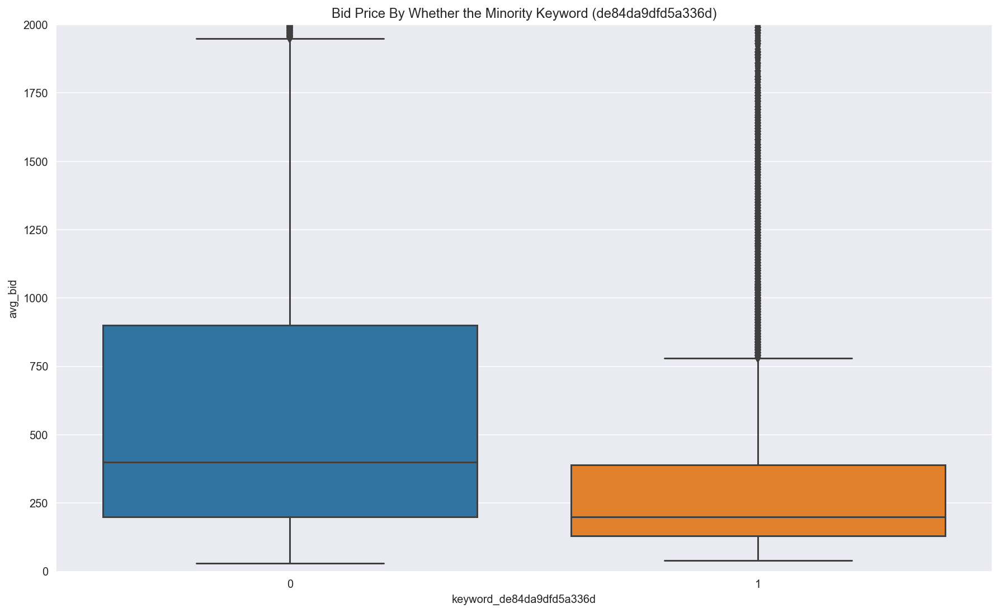

In [68]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Bid Price By Whether the Minority Keyword (de84da9dfd5a336d)') 
plt.ylim(0, 2000)
sns.boxplot(x= "keyword_de84da9dfd5a336d", y= "avg_bid", data=train_df)

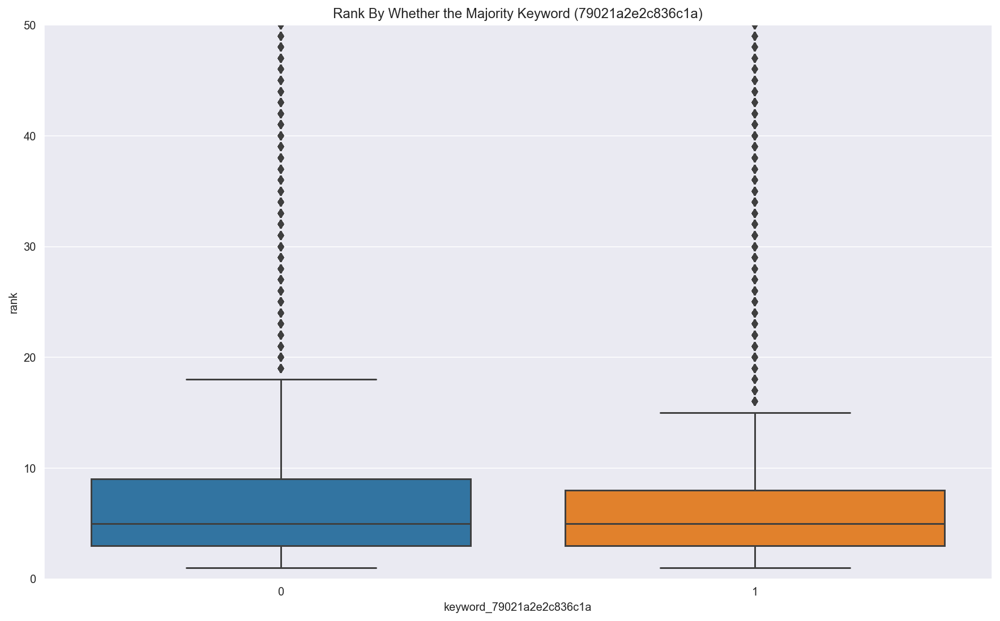

In [74]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Rank By Whether the Majority Keyword (79021a2e2c836c1a)') 
plt.ylim(0, 50)
sns.boxplot(x= "keyword_79021a2e2c836c1a", y= "rank", data=train_df)

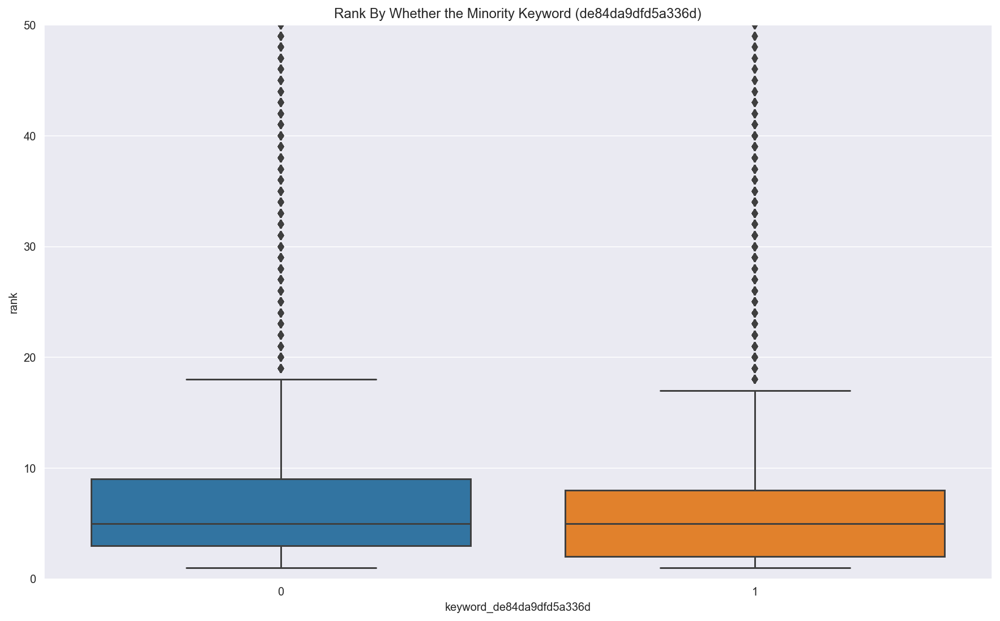

In [75]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Rank By Whether the Minority Keyword (de84da9dfd5a336d)') 
plt.ylim(0, 50)
sns.boxplot(x= "keyword_de84da9dfd5a336d", y= "rank", data=train_df)

### &nbsp;&nbsp; d- accound id (advertiser id)

Given that this variable is an id and has nearly has many categories as there are rows, this variable does not seem to capture a general pattern accross.

Therefore, we perform minimal amount of EDA on it. 

In [ ]:
#number of unique values versus total number of rows
len(df['account_id'].unique())

In [ ]:
#frequency distribution?

### &nbsp;&nbsp; e- rank

In [14]:
pd.options.display.float_format = '{:,.3f}'.format #setting up precision level (number of decimal values = 0)

In [82]:
#frequency distribution: proportion (%)
rankfreq = train_df['rank'].value_counts()*100/len(train_df['rank'])

In [45]:
rankfreq[:20] #rank; percentage in data

1    11.295
2    11.170
3    10.891
4     9.548
5     9.080
6     7.526
7     6.999
8     6.720
9     6.023
10    5.609
11    2.307
12    1.824
13    1.475
14    1.294
15    1.214
16    0.981
17    0.768
18    0.710
19    0.668
20    0.643
Name: rank, dtype: float64

In [86]:
indexes = sorted(train_df['rank'].unique())

In [97]:
len(rankfreq)

97

In [98]:
indexes = range(1,98)
thevalues = rankfreq

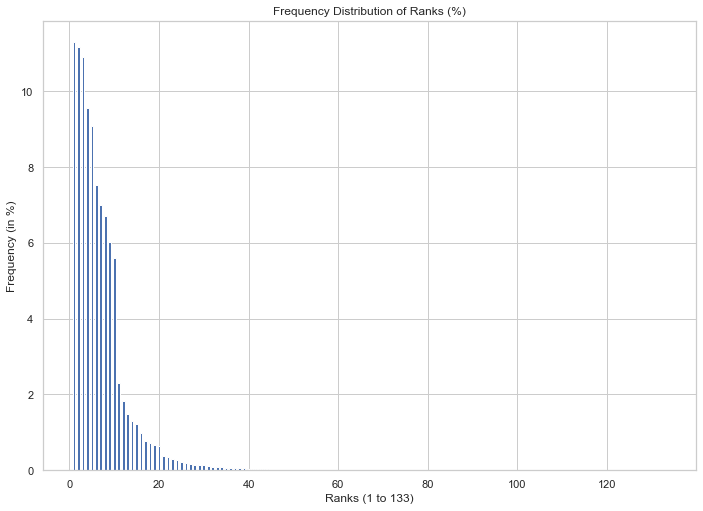

In [44]:
#frequency distribution: percentage
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
width = 0.6
plt.bar(indexes, thevalues, width)
plt.title('Frequency Distribution of Ranks (%)')
plt.xlabel('Ranks')
plt.ylabel('Frequency (in %)')
plt.show()

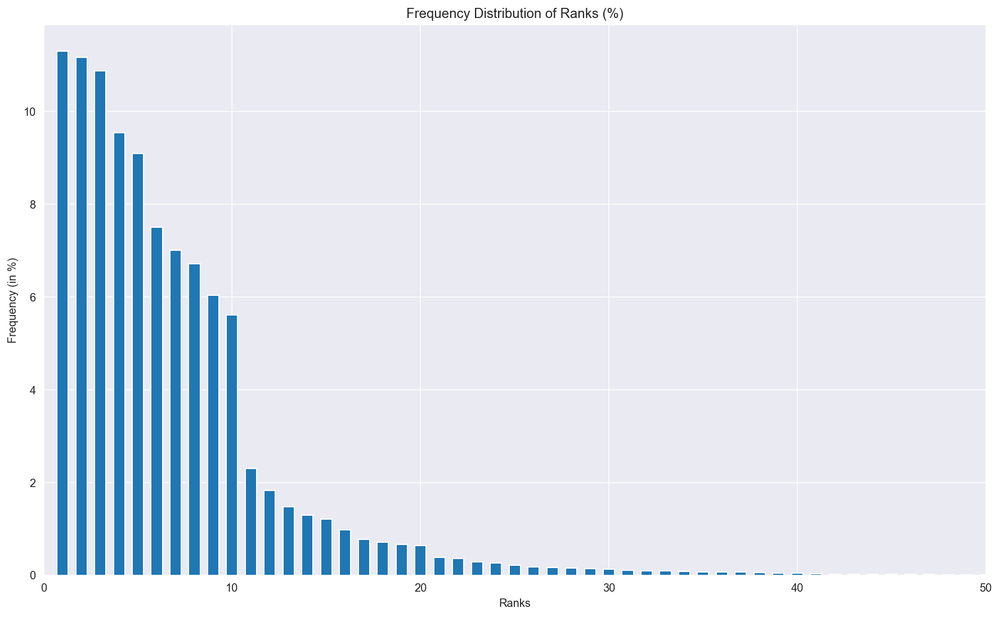

In [102]:
#frequency distribution: percentage
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
width = 0.6
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.bar(indexes, thevalues, width)
plt.xlim(0, 50)
plt.title('Frequency Distribution of Ranks (%)')
plt.xlabel('Ranks')
plt.ylabel('Frequency (in %)')
plt.show()

The first 11 ranks occur a lot and the rest way less (<2%)

In [ ]:
#frequency distribution: count
train_df['rank'].value_counts()

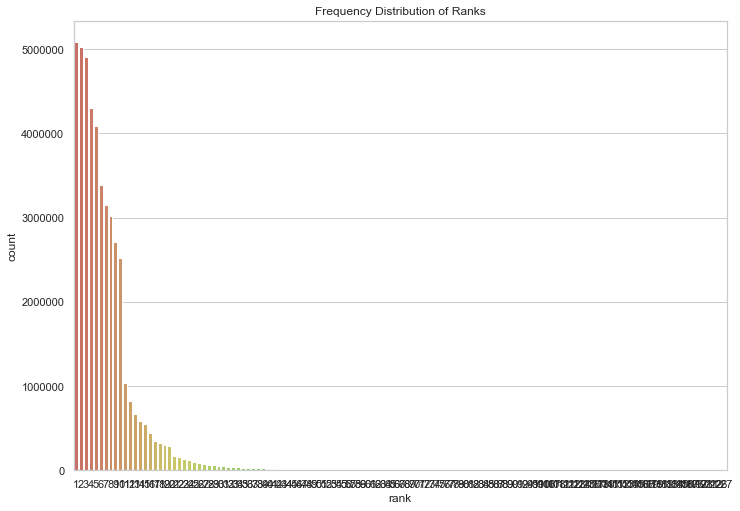

In [24]:
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
plt.title('Frequency Distribution of Ranks') 
sns.countplot(x= "rank",data=train_df, palette='hls')

In [103]:
#summary statistics: max, min, average, sd
train_df['rank'].describe()

count   8,000,000.000
mean            6.707
std             5.909
min             1.000
25%             3.000
50%             5.000
75%             9.000
max           227.000
Name: rank, dtype: float64

In [ ]:
#relation between rank and bid price : barplot with error bar
ax = sns.barplot(x="rank", y="avg_bid", data=train_df, capsize=.2)

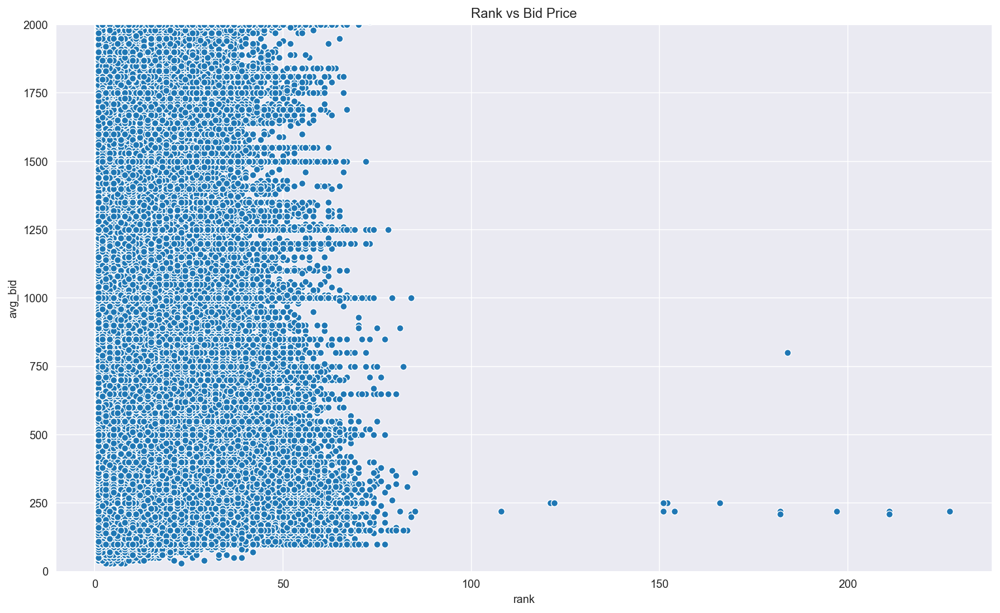

In [105]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Rank vs Bid Price') 
plt.ylim(0, 2000)
sns.scatterplot(x= "rank", y= "avg_bid", data=train_df)

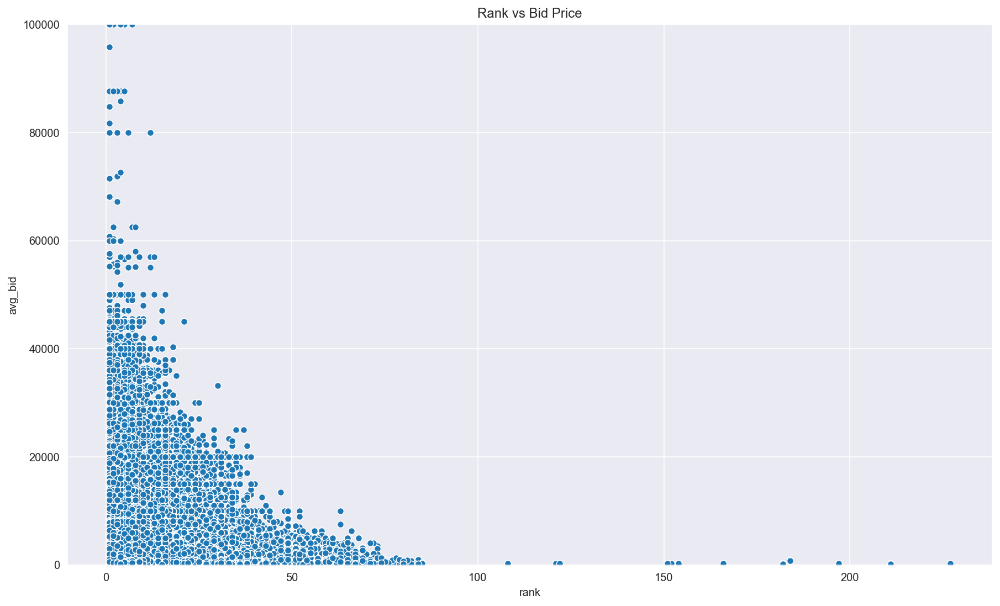

In [110]:
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Rank vs Bid Price') 
plt.ylim(0, 100000)
sns.scatterplot(x= "rank", y= "avg_bid", data=train_df)

In [ ]:
#mean ctr,click,impression,bid price per rank

### &nbsp;&nbsp; f- average bid

In [198]:
#frequency distribution: proportion
rankfreq = round(train_df['avg_bid']).value_counts() # / (len(train_df['avg_bid']))

In [199]:
rankfreq = list(rankfreq)

In [197]:
rankfreq[0]

3349831

In [200]:
pd.options.display.float_format = '{:,.0f}'.format #setting up precision level (number of decimal values = 0)

In [201]:
uniqranks = sorted(round(train_df['avg_bid']).unique())

In [153]:
len(rankfreq)

18073

In [125]:
len(uniqranks)

18073

In [196]:
rankfreq[:10]

[3349831,
 3073303,
 2361833,
 1667436,
 1614759,
 1507575,
 1436803,
 1429985,
 1248285,
 1222636]

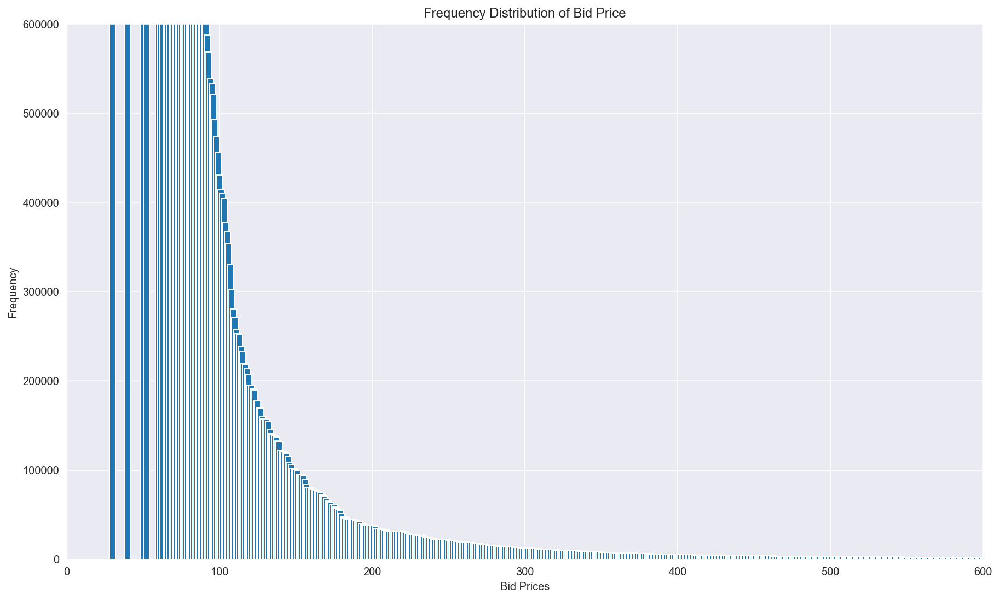

In [204]:
#frequency distribution: percentage
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
width = 4
plt.bar(uniqranks, rankfreq, width)
plt.title('Frequency Distribution of Bid Price')
plt.ylim(0, 600000)
plt.xlim(0, 600)
plt.xlabel('Bid Prices')
plt.ylabel('Frequency')
plt.show()

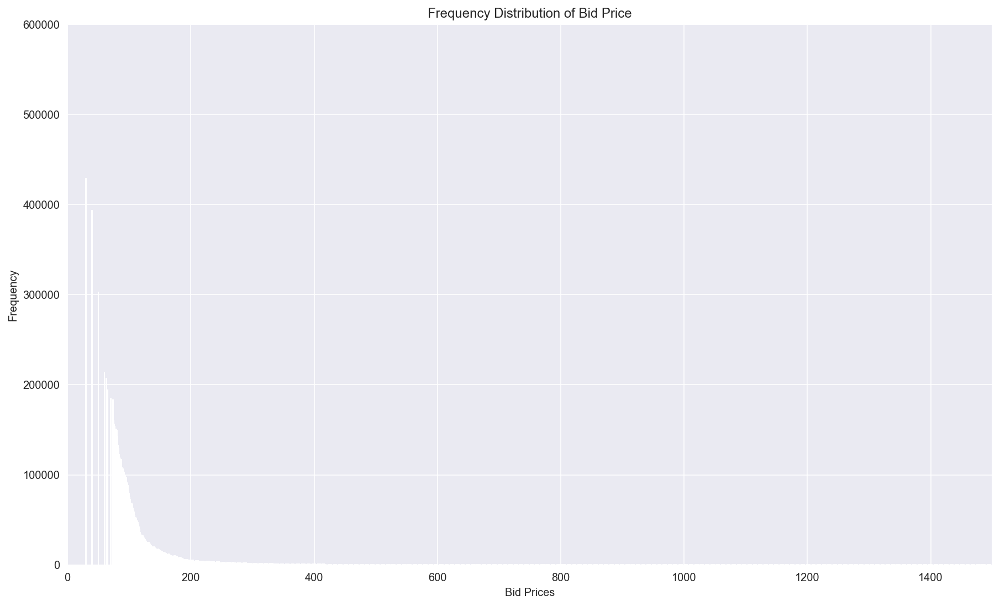

In [170]:
#frequency distribution: percentage
%matplotlib inline 
#%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
width = 0.6
plt.bar(uniqranks, rankfreq, width, color='red')
plt.title('Frequency Distribution of Bid Price')
plt.ylim(0, 600000)
plt.xlim(0, 1500)
plt.xlabel('Bid Prices')
plt.ylabel('Frequency')
plt.show()

Text(0, 0.5, 'Frequency')

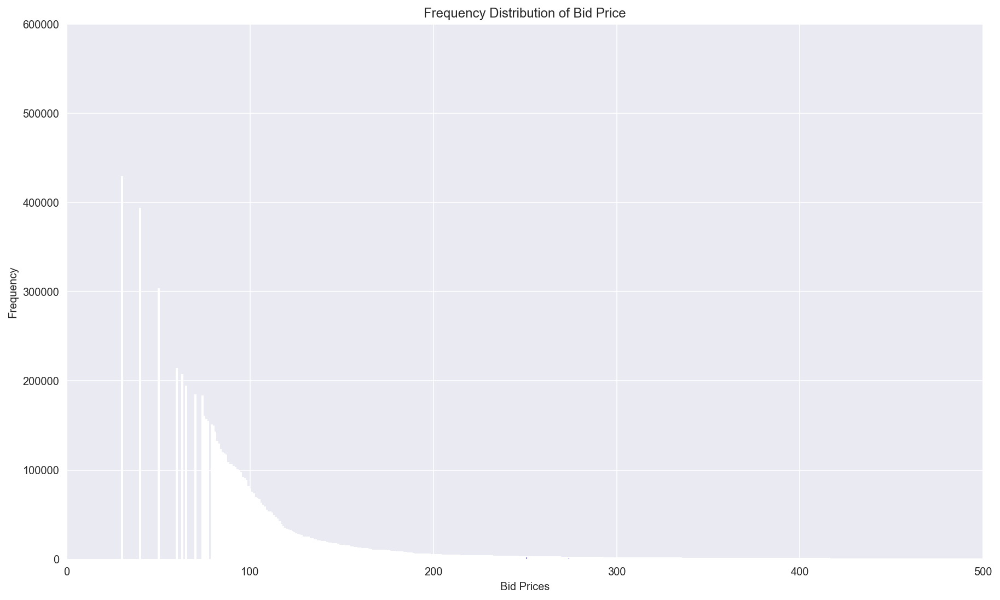

In [166]:
#frequency distribution: percentage
%matplotlib inline 
#%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
width = 0.6
plt.bar(uniqranks, rankfreq, width, color='blue')
plt.title('Frequency Distribution of Bid Price')
plt.ylim(0, 600000)
plt.xlim(0, 500)
plt.xlabel('Bid Prices')
plt.ylabel('Frequency')

In [108]:
#frequency distribution: count
train_df['avg_bid'].value_counts()

100.000      429050
150.000      393617
500.000      302965
1,000.000    213678
200.000      207067
              ...  
484.848           1
4,444.613         1
3,164.500         1
1,997.846         1
302.844           1
Name: avg_bid, Length: 66994, dtype: int64

In [ ]:
#frequency distribution: count
%matplotlib inline 
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Frequency Distribution of bid prices') 
sns.countplot(x= "avg_bid",data=train_df)

In [106]:
#summary statistics: max, min, average, sd
train_df['avg_bid'].describe()

count   8,000,000.000
mean        1,046.167
std         2,600.176
min            30.000
25%           190.000
50%           370.000
75%           840.000
max       999,990.000
Name: avg_bid, dtype: float64

In [ ]:
#mean ctr,click,impression per bid price

## 4- Checking linear regression assumptions 

Note about sample size: the sample size rule of thumb is to have at least 20 cases per independent variable: satisfied.

->large number of variables or low ratio of no. observations to no. variables (including the 𝑛≪𝑝 case), NO!

- Linear relationship between dependent and independent variables
- Multivariate normality of the residuals/errors distribution
- No or little multicollinearity
- No auto-correlation (statistical independence) of residuals/errors
- Homoscedasticity: equal/constant variance of residuals/errors
- Expectation (mean) of residuals is zero

reference: code was found at https://github.com/erykml/medium_articles/blob/master/Statistics/linear_regression_assumptions.ipynb

In [ ]:
# To check the assumptions we fit the model:
# split target and feature  variables in training set

In [ ]:
df.to_pickle("/Users/estelledanilo/Desktop/Thesis3.6/df.feather") #backup data from previous steps

In [3]:
df = pd.read_pickle("/Users/estelledanilo/Desktop/Thesis3.6/df.feather")

In [4]:
##subsampling, otherwise kernel dies with 62 millions training rows
##alternatively we could have built a distributed model
#train_df = df.sample(n=100000, random_state = 5)
#train_df = df.sample(n=1000000, random_state = 5)
#train_df = df.sample(n=7000000) #works
##train_df = df.sample(n=14000000, random_state = 5) #works for model assumptions AND fitting
#train_df = df.sample(n=28000000, random_state = 5) #works
#train_df = df.sample(n=35000000) #works

#train_df = df.sample(n=45000000) #works but very very long 

####train_df = df.sample(n=45000000, random_state = 5) #for the rest of the models

train_df = df.sample(n=4000000, random_state = 5) #only for gamma model

#goal is 540000000 (70% of dataset) but kernel dies

In [5]:
predictor = ['avg_bid', 'day_of_week', 'day_of_month', 'month', 'click_through_rate',
       'keyword_79021a2e2c836c1a', 'keyword_cd74a8342d25d090',
       'keyword_3db691494440189b', 'keyword_aef4ee042bea9c6b', 'keyword_de84da9dfd5a336d',
       'keyword_remaining']

In [5]:
train_df.columns.values

array(['day', 'account_id', 'rank', 'five_keywords', 'avg_bid',
       'impressions', 'clicks', 'day_of_week', 'day_of_month',
       'week_of_month', 'month', 'click_through_rate',
       'keyword_79021a2e2c836c1a', 'keyword_cd74a8342d25d090',
       'keyword_3db691494440189b', 'keyword_aef4ee042bea9c6b',
       'keyword_fc4f04e287746c48', 'keyword_de84da9dfd5a336d',
       'keyword_remaining'], dtype=object)

In [34]:
train_df.shape

(4000000, 19)

In [6]:
y = train_df['rank'] #or train_df.label

In [7]:
X = train_df[predictor]

One thing to bear in mind is that when using linear regression in statsmodels 
we need to add a column of ones to serve as intercept. For that I use add_constant.
The results are much more informative than the default ones from sklearn

In [9]:
X_constant = sm.add_constant(X)

#### Baseline linear model

In [11]:
#fit model
lin_reg = sm.OLS(y,X_constant).fit()

In [12]:
lin_reg.summary()

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1755: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(eigvals[0]/eigvals[-1])
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   rank   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.036
Method:                 Least Squares   F-statistic:                 1.502e+04
Date:                Thu, 19 Dec 2019   Prob (F-statistic):               0.00
Time:                        23:57:07   Log-Likelihood:            -1.2708e+07
No. Observations:             4000000   AIC:                         2.542e+07
Df Residuals:                 3999989   BIC:                         2.542e+07
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        8.2047      0.047    175.107      0.000       8.113       8.296
avg_bid                     -0.0002   1.25e-06   -148.983      0.000      -0.000      -0.000
day_of_week                 -0.0147      0.001    -10.142      0.000      -0.018      -0.012
day_of_month                 0.0038      0.000     11.809      0.000       0.003       0.004
month                       -0.0391      0.003    -15.411      0.000      -0.044      -0.034
click_through_rate          -5.1813      0.033   -155.684      0.000      -5.247      -5.116
keyword_79021a2e2c836c1a    -1.6905      0.046    -36.943      0.000      -1.780      -1.601
keyword_cd74a8342d25d090    -2.2663      0.046    -49.517      0.000      -2.356      -2.177
keyword_3db691494440189b    -0.1479      0.046     -3.204      0.001      -0.238      -0.057
keyword_aef4ee042bea9c6b     0.5965      0.045     13.130      0.000       0.507       0.686
keyword_de84da9dfd5a336d    -1.7506      0.047    -37.483      0.000      -1.842      -1.659
keyword_remaining                 0          0        nan        nan           0           0
==============================================================================
Omnibus:                  2283356.614   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         28840599.417
Skew:                           2.519   Prob(JB):                         0.00
Kurtosis:                      15.152   Cond. No.                          inf
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is      0. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [13]:
fitted_vals = lin_reg.predict()

In [14]:
resids = lin_reg.resid

#### Linear model with log rank
Refitting the model with outcome as natural log of rank:

In [9]:
logy = np.log(y)

In [10]:
#fit model
lin_reg_log = sm.OLS(logy,X_constant).fit()

In [18]:
lin_reg_log.summary()

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1755: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(eigvals[0]/eigvals[-1])


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   rank   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.039
Method:                 Least Squares   F-statistic:                 1.611e+04
Date:                Thu, 19 Dec 2019   Prob (F-statistic):               0.00
Time:                        08:48:32   Log-Likelihood:            -4.9374e+06
No. Observations:             4000000   AIC:                         9.875e+06
Df Residuals:                 3999989   BIC:                         9.875e+06
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        1.7497      0.007    260.550      0.000       1.736       1.763
avg_bid                  -2.649e-05   1.79e-07   -148.069      0.000   -2.68e-05   -2.61e-05
day_of_week                 -0.0019      0.000     -9.009      0.000      -0.002      -0.001
day_of_month                 0.0002   4.67e-05      3.551      0.000    7.43e-05       0.000
month                       -0.0124      0.000    -34.196      0.000      -0.013      -0.012
click_through_rate          -1.1425      0.005   -239.521      0.000      -1.152      -1.133
keyword_79021a2e2c836c1a    -0.1483      0.007    -22.608      0.000      -0.161      -0.135
keyword_cd74a8342d25d090    -0.2589      0.007    -39.477      0.000      -0.272      -0.246
keyword_3db691494440189b     0.0405      0.007      6.125      0.000       0.028       0.053
keyword_aef4ee042bea9c6b     0.0850      0.007     13.061      0.000       0.072       0.098
keyword_de84da9dfd5a336d    -0.2006      0.007    -29.975      0.000      -0.214      -0.188
keyword_remaining                 0          0        nan        nan           0           0
==============================================================================
Omnibus:                    32577.553   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33379.579
Skew:                          -0.224   Prob(JB):                         0.00
Kurtosis:                       3.018   Cond. No.                          inf
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is      0. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [19]:
sorted(y)[:10]

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [20]:
sorted(logy)[:10]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [21]:
fitted_vals_log = lin_reg_log.predict()

In [22]:
resids_log = lin_reg_log.resid

In [23]:
sorted(fitted_vals_log)[:10]

[-25.0100688989986,
 -25.0100688989986,
 -11.217599311321738,
 -11.215888888137489,
 -5.475212543356853,
 -5.263712296305149,
 -5.256410296232767,
 -5.252400795036373,
 -5.252400795036373,
 -5.251851487280328]

The framework of generalized linear models provides several options for dependent variables that are bounded: 
 Gamma for continuous positives
 Logistic for chances (bounded by 0 and 1). 

#### Gamma model :

In [10]:
gamma_model = sm.GLM(y,X_constant, family=sm.families.Gamma()).fit() #need to subsample otherwise kernel dies

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/genmod/generalized_linear_model.py:273: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  DomainWarning)


In [11]:
gamma_model.summary()

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                   rank   No. Observations:              4000000
Model:                            GLM   Df Residuals:                  3999989
Model Family:                   Gamma   Df Model:                           10
Link Function:          inverse_power   Scale:                         0.71194
Method:                          IRLS   Log-Likelihood:            -1.1291e+07
Date:                Thu, 19 Dec 2019   Deviance:                   2.5374e+06
Time:                        08:29:35   Pearson chi2:                 2.85e+06
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        0.1153      0.001    105.399      0.000       0.113       0.117
avg_bid                   5.545e-06   3.78e-08    146.550      0.000    5.47e-06    5.62e-06
day_of_week                  0.0003    3.1e-05     10.129      0.000       0.000       0.000
day_of_month             -8.591e-05   6.95e-06    -12.354      0.000   -9.95e-05   -7.23e-05
month                        0.0008   5.41e-05     15.054      0.000       0.001       0.001
click_through_rate           0.3162      0.002    170.891      0.000       0.313       0.320
keyword_79021a2e2c836c1a     0.0379      0.001     35.314      0.000       0.036       0.040
keyword_cd74a8342d25d090     0.0541      0.001     50.323      0.000       0.052       0.056
keyword_3db691494440189b     0.0060      0.001      5.522      0.000       0.004       0.008
keyword_aef4ee042bea9c6b    -0.0094      0.001     -8.819      0.000      -0.011      -0.007
keyword_de84da9dfd5a336d     0.0394      0.001     35.991      0.000       0.037       0.042
keyword_remaining                 0          0        nan        nan           0           0
============================================================================================
"""

In [18]:
gamma_model.aic # 22,581,319 versus 9,875,000 for linear reg with log outcome

22581319.362790644

In [12]:
fitted_vals_gamma = gamma_model.predict()

In [ ]:
#resids_gamma = gamma_model.resid

A similar model is log-link lognormal regression (taking logs and fitting an ordinary linear regression model)

#### Fitting linear model with normalized features

In [12]:
scaler = MinMaxScaler() 
X_scaled = scaler.fit_transform(X)

In [13]:
X_constant_scaled = sm.add_constant(X_scaled)

In [58]:
lin_reg_norm = sm.OLS(y,X_constant_scaled).fit()

In [59]:
lin_reg_norm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   rank   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.036
Method:                 Least Squares   F-statistic:                 1.502e+04
Date:                Thu, 19 Dec 2019   Prob (F-statistic):               0.00
Time:                        15:11:00   Log-Likelihood:            -1.2708e+07
No. Observations:             4000000   AIC:                         2.542e+07
Df Residuals:                 3999989   BIC:                         2.542e+07
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.1453      0.046    175.405      0.000       8.054       8.236
x1          -185.9561      1.248   -148.983      0.000    -188.402    -183.510
x2            -0.0884      0.009    -10.142      0.000      -0.106      -0.071
x3             0.1155      0.010     11.809      0.000       0.096       0.135
x4            -0.1172      0.008    -15.411      0.000      -0.132      -0.102
x5           -20.7252      0.133   -155.684      0.000     -20.986     -20.464
x6            -1.6905      0.046    -36.943      0.000      -1.780      -1.601
x7            -2.2663      0.046    -49.517      0.000      -2.356      -2.177
x8            -0.1479      0.046     -3.204      0.001      -0.238      -0.057
x9             0.5965      0.045     13.130      0.000       0.507       0.686
x10           -1.7506      0.047    -37.483      0.000      -1.842      -1.659
x11                 0          0        nan        nan           0           0
==============================================================================
Omnibus:                  2283356.614   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         28840599.417
Skew:                           2.519   Prob(JB):                         0.00
Kurtosis:                      15.152   Cond. No.                          inf
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is      0. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [44]:
fitted_vals_norm = lin_reg_norm.predict()

In [45]:
resids_norm = lin_reg_norm.resid

#### Fitting linear model with normalized features and with log outcome

In [14]:
lin_reg_norm_log = sm.OLS(logy,X_constant_scaled).fit()

In [52]:
lin_reg_norm_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   rank   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.039
Method:                 Least Squares   F-statistic:                 1.611e+04
Date:                Thu, 19 Dec 2019   Prob (F-statistic):               0.00
Time:                        15:10:11   Log-Likelihood:            -4.9374e+06
No. Observations:             4000000   AIC:                         9.875e+06
Df Residuals:                 3999989   BIC:                         9.875e+06
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.7346      0.007    260.628      0.000       1.722       1.748
x1           -26.4876      0.179   -148.069      0.000     -26.838     -26.137
x2            -0.0113      0.001     -9.009      0.000      -0.014      -0.009
x3             0.0050      0.001      3.551      0.000       0.002       0.008
x4            -0.0373      0.001    -34.196      0.000      -0.039      -0.035
x5            -4.5698      0.019   -239.521      0.000      -4.607      -4.532
x6            -0.1483      0.007    -22.608      0.000      -0.161      -0.135
x7            -0.2589      0.007    -39.477      0.000      -0.272      -0.246
x8             0.0405      0.007      6.125      0.000       0.028       0.053
x9             0.0850      0.007     13.061      0.000       0.072       0.098
x10           -0.2006      0.007    -29.975      0.000      -0.214      -0.188
x11                 0          0        nan        nan           0           0
==============================================================================
Omnibus:                    32577.553   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            33379.579
Skew:                          -0.224   Prob(JB):                         0.00
Kurtosis:                       3.018   Cond. No.                          inf
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is      0. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [15]:
fitted_vals_norm_log = lin_reg_norm_log.predict()

In [16]:
resids_norm_log = lin_reg_norm_log.resid

#### Ordinal regression 

We could have tried this method but given 100+ possible rank outcomes, this type of regression does not make sense. 

### &nbsp;&nbsp; a- Linearity test

Visually inspecting the assumption of linearity in a linear regression model.
It plots observed vs. predicted values and residuals vs. predicted values.
    * model - fitted OLS model from statsmodels
    * y - observed values

#### Baseline linear model

In [38]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)

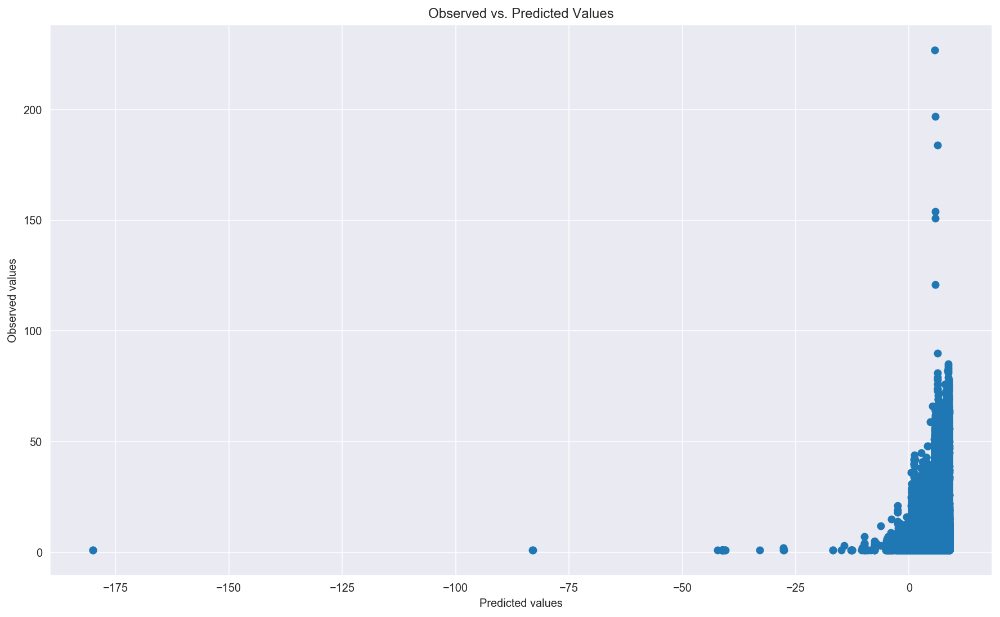

In [39]:
plt.title('Observed vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Observed values')
plt.scatter(x=fitted_vals, y=y)
plt.show()

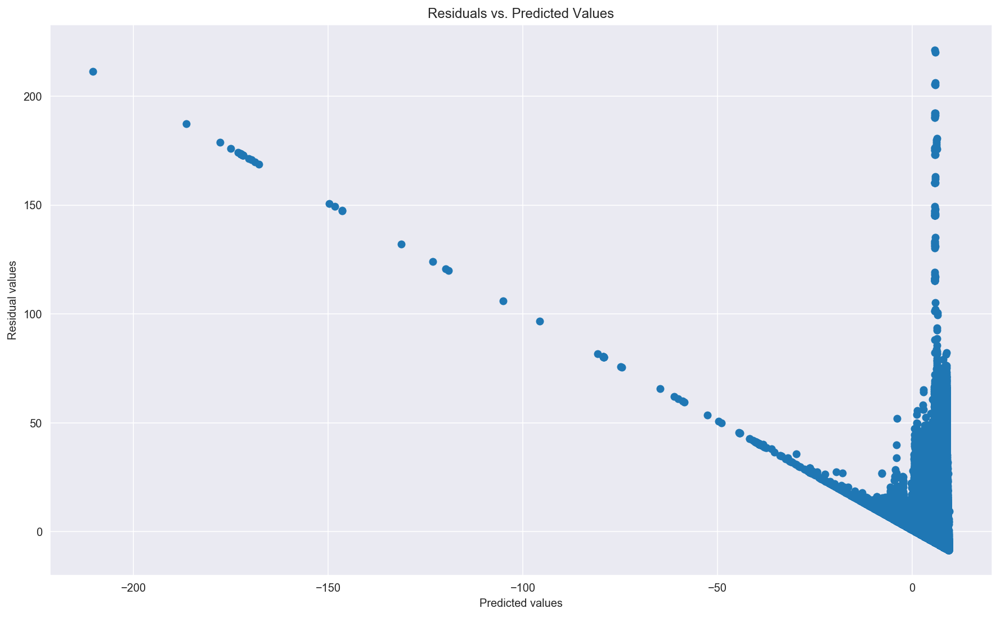

In [53]:
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Residual values')
plt.scatter(x=fitted_vals, y=resids)
plt.show()

The plot shows the spread is not constant. Heteroskedasticity?

The predictions are negative, therefore we refit the model using natural log of rank to better bound the outcome Y, which does not take the value 0 (log 0 not defined). 

#### Linear model with log rank

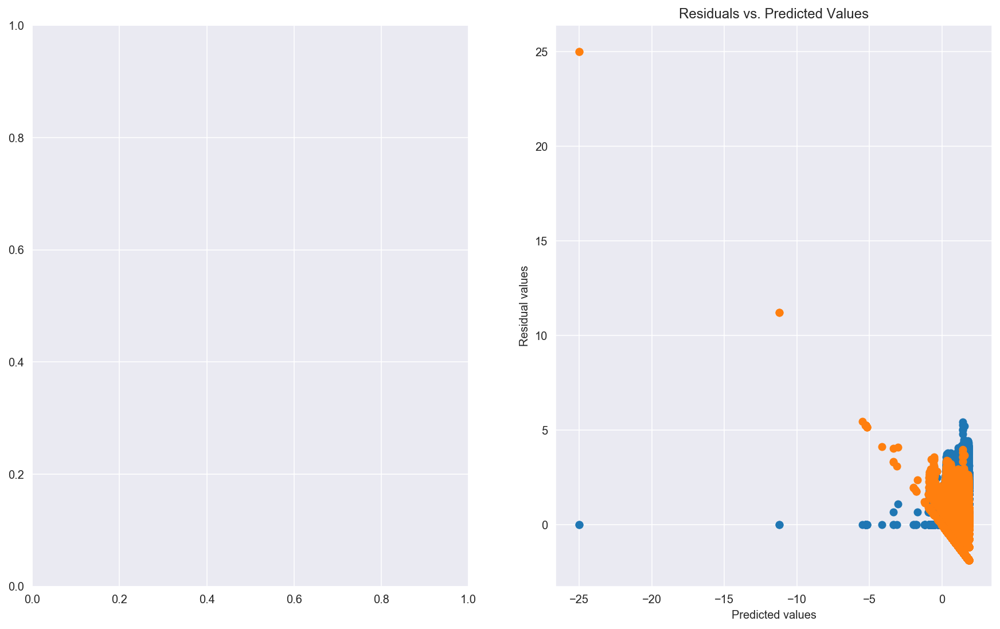

In [29]:
##to try again to put plots next to each other

%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
fig, ax = plt.subplots(nrows=1, ncols=2)

plt.title('Observed vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Observed values')
plt.scatter(x=fitted_vals_log, y=logy)

plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Residual values')
plt.scatter(x=fitted_vals_log, y=resids_log)

#plt.show()

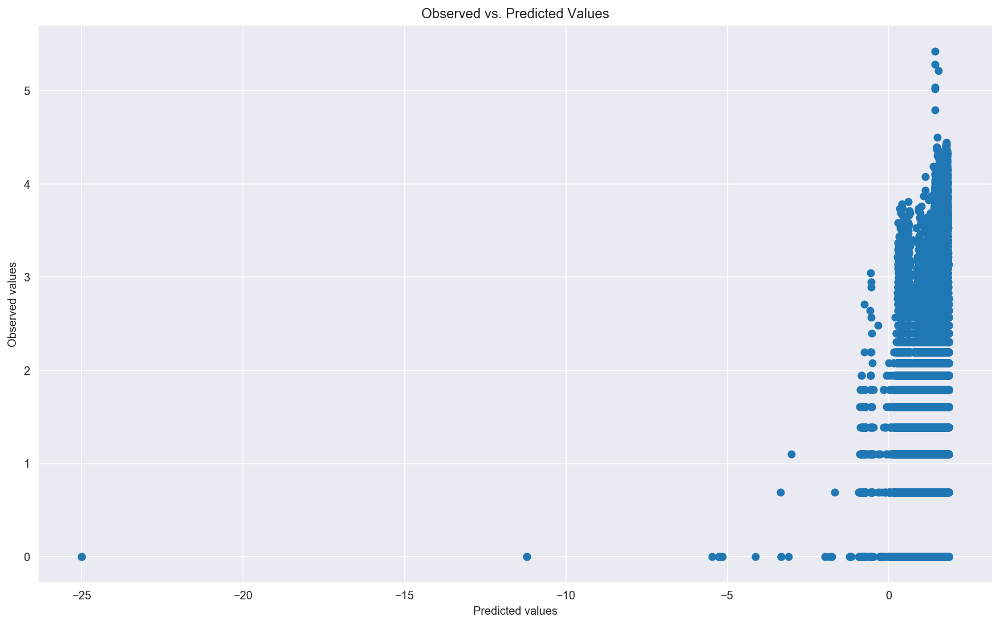

In [32]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)

plt.title('Observed vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Observed values')
plt.scatter(x=fitted_vals_log, y=logy)

plt.show()

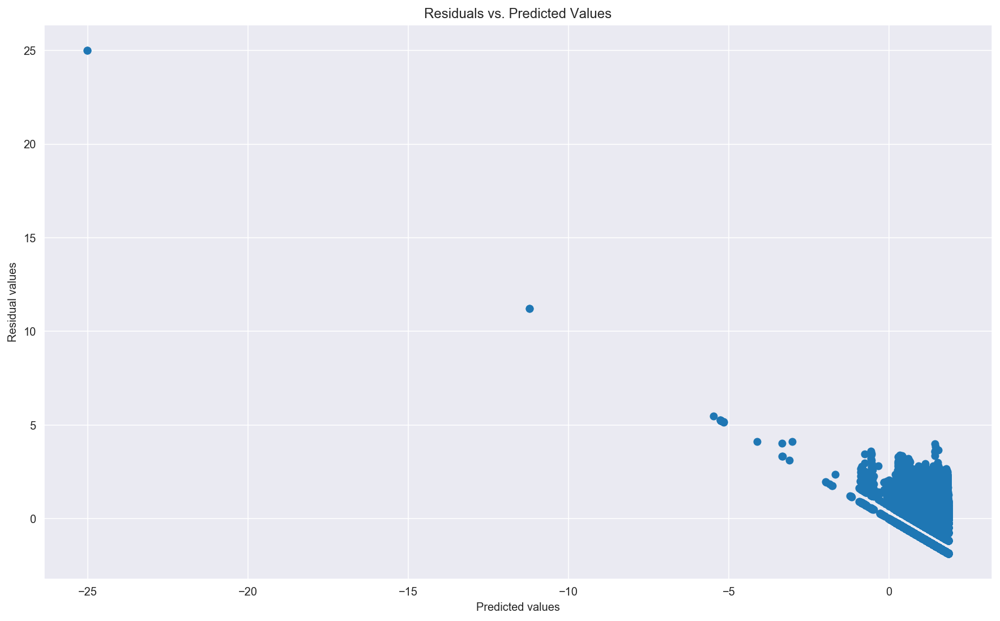

In [26]:
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Residual values')
plt.scatter(x=fitted_vals_log, y=resids_log)
plt.show()

Rank is log-normally distributed, therefore we attempt to fit a 
#### Gamma model:

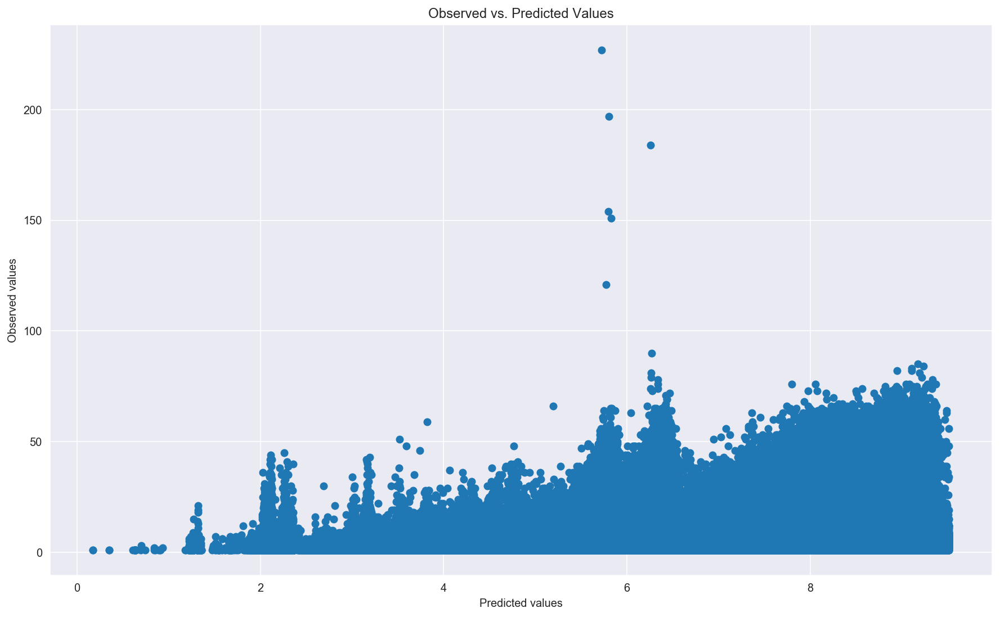

In [14]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Observed vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Observed values')
plt.scatter(x=fitted_vals_gamma, y=y)
plt.show()

#### Linear regression with normalized features

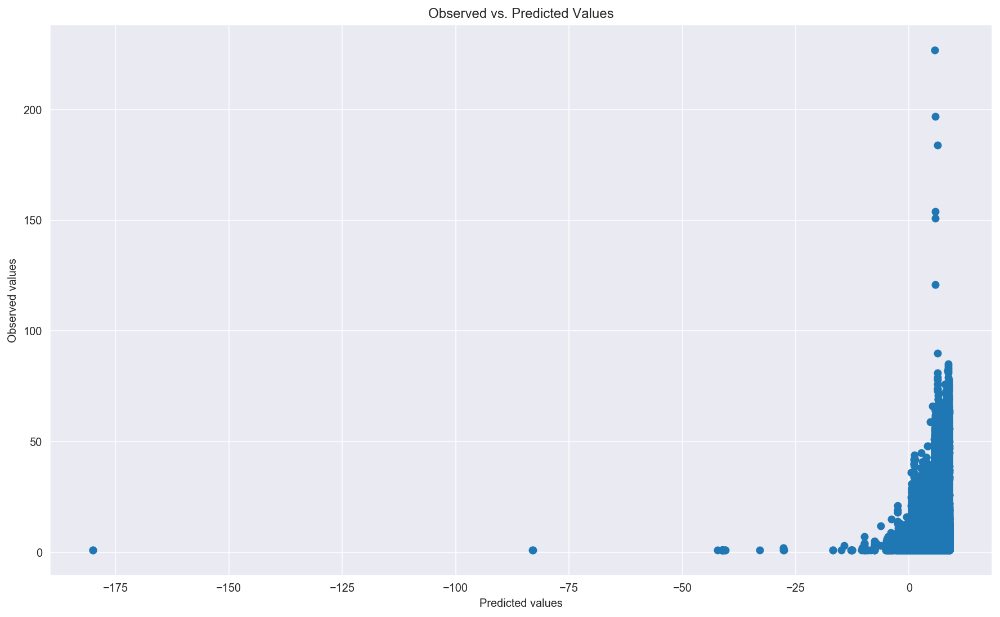

In [46]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Observed vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Observed values')
plt.scatter(x=fitted_vals_norm, y=y)
plt.show()

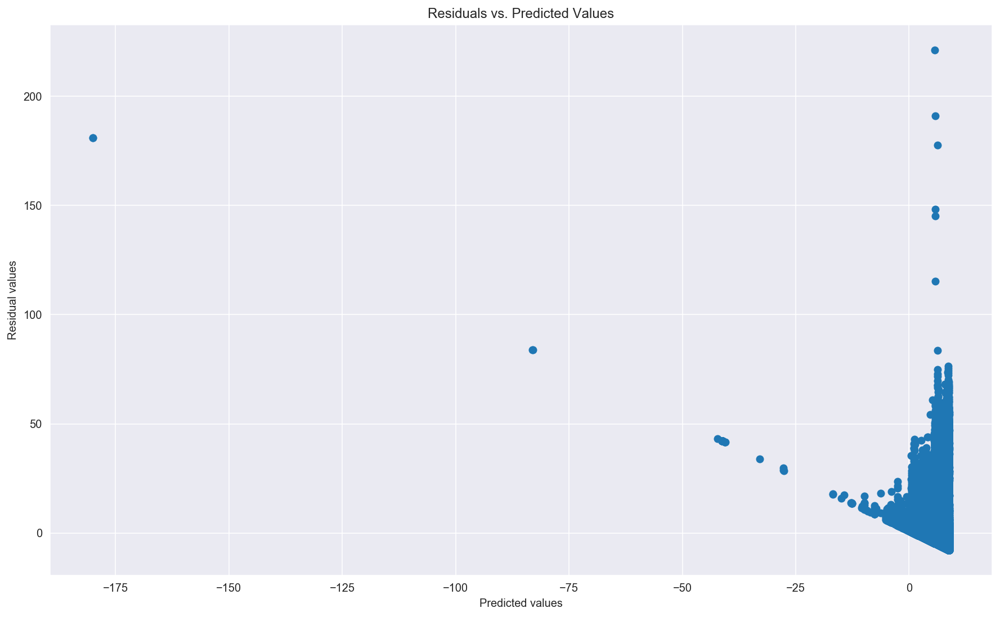

In [47]:
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Residual values')
plt.scatter(x=fitted_vals_norm, y=resids_norm)
plt.show()

#### Linear regression with normalized features and log outcome

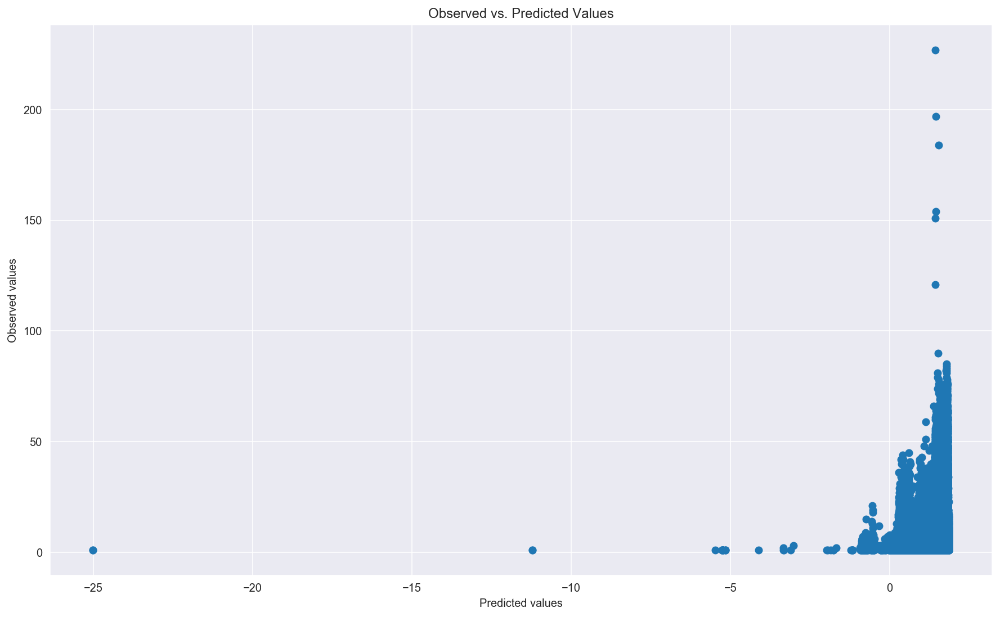

In [48]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Observed vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Observed values')
plt.scatter(x=fitted_vals_norm_log, y=y)
plt.show()

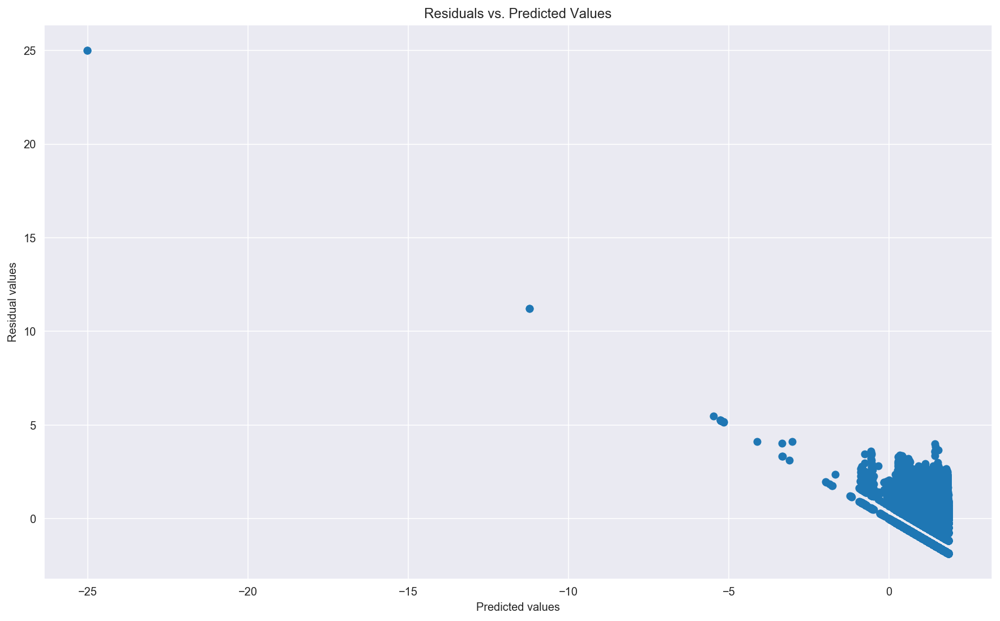

In [49]:
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Residual values')
plt.scatter(x=fitted_vals_norm_log, y=resids_norm_log)
plt.show()

### &nbsp;&nbsp; b- Multivariate normality of residuals

Drawing the normal QQ-plot of the residuals and running 4 statistical tests to investigate the normality of residuals.

* model - fitted OLS models from statsmodels

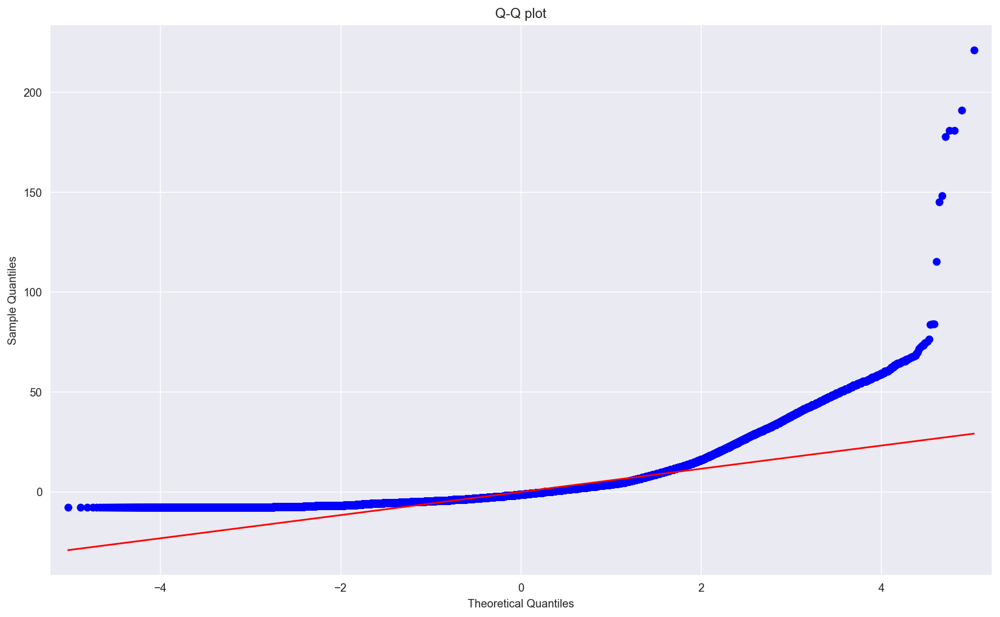

In [60]:
sm.ProbPlot(lin_reg_norm.resid).qqplot(line='s');
plt.title('Q-Q plot');

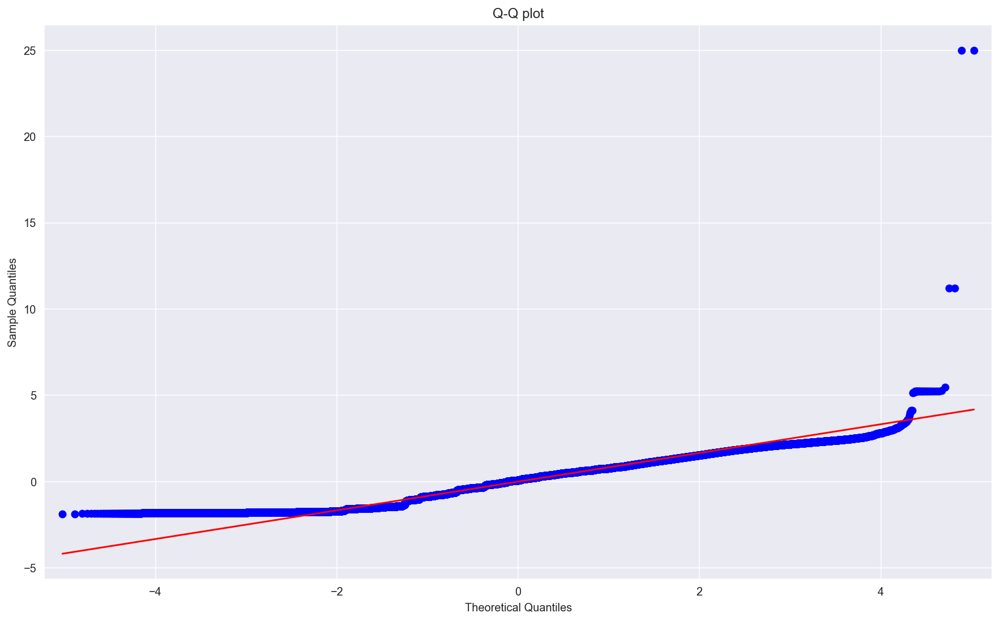

In [61]:
sm.ProbPlot(lin_reg_norm_log.resid).qqplot(line='s');
plt.title('Q-Q plot');

In [60]:
jb = stats.jarque_bera(lin_reg.resid)
sw = stats.shapiro(lin_reg.resid)
ad = stats.anderson(lin_reg.resid, dist='norm')
ks = stats.kstest(lin_reg.resid, 'norm')
    
print(f'Jarque-Bera test ---- statistic: {jb[0]:.4f}, p-value: {jb[1]}')
print(f'Shapiro-Wilk test ---- statistic: {sw[0]:.4f}, p-value: {sw[1]:.4f}')
print(f'Kolmogorov-Smirnov test ---- statistic: {ks.statistic:.4f}, p-value: {ks.pvalue:.4f}')
print(f'Anderson-Darling test ---- statistic: {ad.statistic:.4f}, 5% critical value: {ad.critical_values[2]:.4f}')
print('If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. ')

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Jarque-Bera test ---- statistic: 28840599.4172, p-value: 0.0
Shapiro-Wilk test ---- statistic: 0.8088, p-value: 0.0000
Kolmogorov-Smirnov test ---- statistic: 0.4226, p-value: 0.0000
Anderson-Darling test ---- statistic: 155319.6295, 5% critical value: 0.7870
If the returned AD statistic is larger than the critical value, then for the 5% significance level, the null hypothesis that the data come from the Normal distribution should be rejected. 


However, in large sample inference normality is not needed anymore due to the central limit theorem.

### &nbsp;&nbsp; c- No or little multicollinearity ?

In [61]:
vif = [variance_inflation_factor(X_constant.values, i) for i in range(X_constant.shape[1])]
pd.DataFrame({'vif': vif[1:]}, index=X.columns).T

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1636: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


,avg_bid,day_of_week,day_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_de84da9dfd5a336d,keyword_remaining
vif,1.245733,1.000312,1.001312,1.002964,1.001583,50.311203,47.22578,41.690464,34.099993,22.052592,NaN


In [22]:
#heatmap
pearson = train_df.corr(method='pearson')

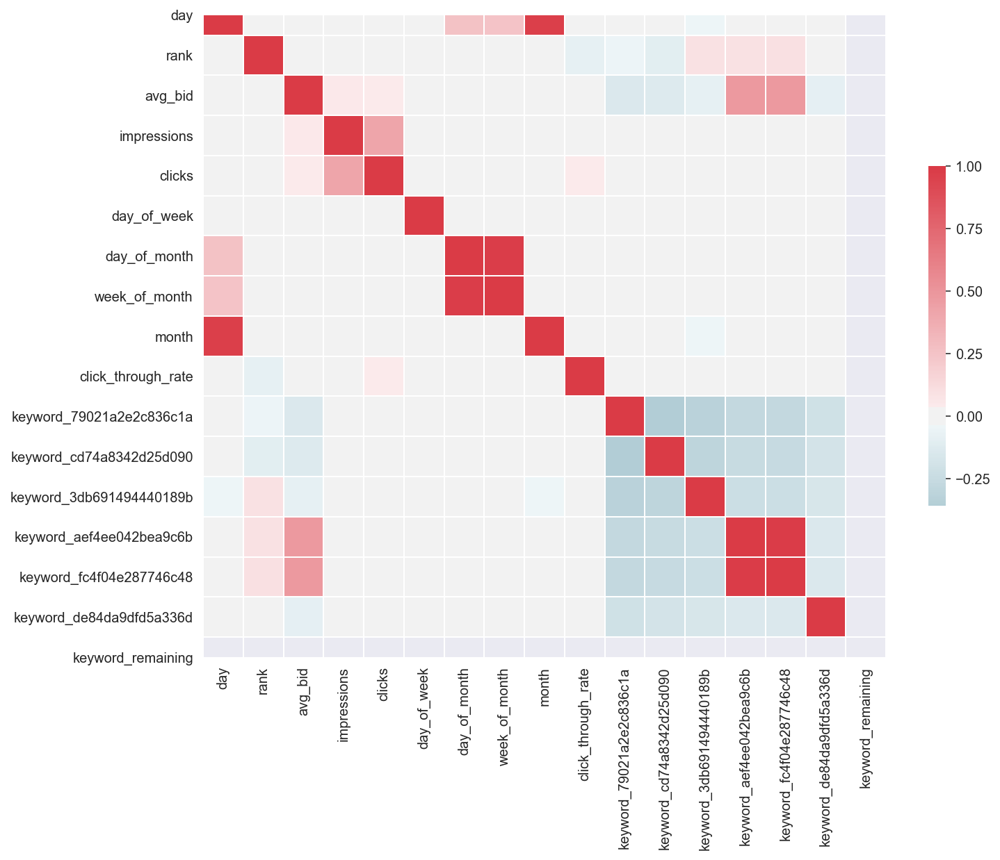

In [24]:
f, ax = plt.subplots(figsize=(11,9))

#generate a custum diverging colormap
cmap = sns.diverging_palette(220,10,as_cmap= True)

#draw the heatmap with the mask and correct aspect ratio
sns.heatmap(pearson, cmap=cmap, vmax=1,center=0, square=True,linewidths=.5,cbar_kws={"shrink":0.5})

In [62]:
#correlation matrix
train_df.corr()

,day,rank,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_fc4f04e287746c48,keyword_de84da9dfd5a336d,keyword_remaining
day,1.000000,-0.010090,0.011051,3.076400e-04,0.001614,0.017494,0.255183,2.515900e-01,0.969288,0.005331,0.018885,0.007002,-0.040166,0.010447,0.011263,0.002327,NaN
rank,-0.010090,1.000000,-0.020353,-8.155747e-03,-0.014164,-0.004759,0.003641,5.176713e-03,-0.011401,-0.080815,-0.047895,-0.102218,0.092249,0.096443,0.097610,-0.026587,NaN
avg_bid,0.011051,-0.020353,1.000000,2.831878e-02,0.017698,0.005105,0.003881,3.755828e-03,0.010591,-0.006668,-0.135700,-0.113786,-0.073752,0.439108,0.443497,-0.082251,NaN
impressions,0.000308,-0.008156,0.028319,1.000000e+00,0.152092,-0.000143,-0.000153,9.257858e-07,0.000300,-0.000908,0.002485,-0.005693,-0.000536,0.004780,0.004929,-0.000926,NaN
clicks,0.001614,-0.014164,0.017698,1.520919e-01,1.000000,-0.000298,-0.000808,-7.194306e-04,0.001863,0.036919,0.000838,-0.002022,0.003193,-0.002535,-0.002485,0.000369,NaN
day_of_week,0.017494,-0.004759,0.005105,-1.428796e-04,-0.000298,1.000000,-0.003491,-8.717282e-03,0.012403,-0.000840,0.005955,-0.010141,-0.000962,0.002612,0.002526,0.004043,NaN
day_of_month,0.255183,0.003641,0.003881,-1.533987e-04,-0.000808,-0.003491,1.000000,9.755331e-01,0.033973,0.001714,0.005697,0.004078,-0.011550,-0.000516,-0.000424,0.001796,NaN
week_of_month,0.251590,0.005177,0.003756,9.257858e-07,-0.000719,-0.008717,0.975533,1.000000e+00,0.034247,0.001679,0.005071,0.003685,-0.011003,0.000107,0.000199,0.001807,NaN
month,0.969288,-0.011401,0.010591,3.001748e-04,0.001863,0.012403,0.033973,3.424713e-02,1.000000,0.005080,0.018095,0.006252,-0.038927,0.011315,0.012139,0.001820,NaN
click_through_rate,0.005331,-0.080815,-0.006668,-9.079227e-04,0.036919,-0.000840,0.001714,1.678851e-03,0.005080,1.000000,0.011429,0.008023,0.008623,-0.037279,-0.037775,0.006401,NaN


In [69]:
train_df['keyword_79021a2e2c836c1a'].value_counts()

0    2874842
1    1125158
Name: keyword_79021a2e2c836c1a, dtype: int64

It is normal to have NaN for keyword_remaining because the values do not vary much. 
To see why take a look at correlation formula:

cor(i,j) = cov(i,j)/[stdev(i)*stdev(j)]

If the values of the ith or jth variable do not vary, then the respective standard deviation will be zero and so will the denominator of the fraction. \
Thus, the correlation will be NaN

From the corr plot, we decide to remove one of two predictors highly correlated (cor ~ 1):
- day or month (0.96) -> we delete day
- week of month or day of month (0.97) -> we delete week of month
- keyword_fc4f04e287746c48 or keyword_aef4ee042bea9c6b (0.98) -> we want to control for all keywords

and less correlated features (cor ~0.5):
- clicks or impressions (0.15)-> we remove both as we already have ctr 
- avg_bid or keyword_aef4ee042bea9c6b (0.43) -> we cannot remove
- avg_bid or keyword_fc4f04e287746c48 (0.44) -> we cannot remove

Therefore, we decide to use Penalized regression with L1 norm (LASSO regression) or  L2 norm (ridge regression)

### &nbsp;&nbsp; d- No auto-correlation of residuals

In the model summary below, we can see that the Durbin-Watson test statistic yields 2. \
A value of 2 means that there is no autocorrelation in the sample

In [13]:
lin_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   rank   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.036
Method:                 Least Squares   F-statistic:                 1.502e+04
Date:                Thu, 19 Dec 2019   Prob (F-statistic):               0.00
Time:                        23:57:25   Log-Likelihood:            -1.2708e+07
No. Observations:             4000000   AIC:                         2.542e+07
Df Residuals:                 3999989   BIC:                         2.542e+07
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        8.2047      0.047    175.107      0.000       8.113       8.296
avg_bid                     -0.0002   1.25e-06   -148.983      0.000      -0.000      -0.000
day_of_week                 -0.0147      0.001    -10.142      0.000      -0.018      -0.012
day_of_month                 0.0038      0.000     11.809      0.000       0.003       0.004
month                       -0.0391      0.003    -15.411      0.000      -0.044      -0.034
click_through_rate          -5.1813      0.033   -155.684      0.000      -5.247      -5.116
keyword_79021a2e2c836c1a    -1.6905      0.046    -36.943      0.000      -1.780      -1.601
keyword_cd74a8342d25d090    -2.2663      0.046    -49.517      0.000      -2.356      -2.177
keyword_3db691494440189b    -0.1479      0.046     -3.204      0.001      -0.238      -0.057
keyword_aef4ee042bea9c6b     0.5965      0.045     13.130      0.000       0.507       0.686
keyword_de84da9dfd5a336d    -1.7506      0.047    -37.483      0.000      -1.842      -1.659
keyword_remaining                 0          0        nan        nan           0           0
==============================================================================
Omnibus:                  2283356.614   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         28840599.417
Skew:                           2.519   Prob(JB):                         0.00
Kurtosis:                      15.152   Cond. No.                          inf
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is      0. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

### &nbsp;&nbsp; e- Homoscedasticity: equal variance of residuals

Testing the homoscedasticity of residuals in a linear regression model. It plots residuals and standardized residuals vs. fitted values and runs Breusch-Pagan and Goldfeld-Quandt tests.
* model - fitted OLS model from statsmodels

In [70]:
resids_standardized = lin_reg.get_influence().resid_studentized_internal

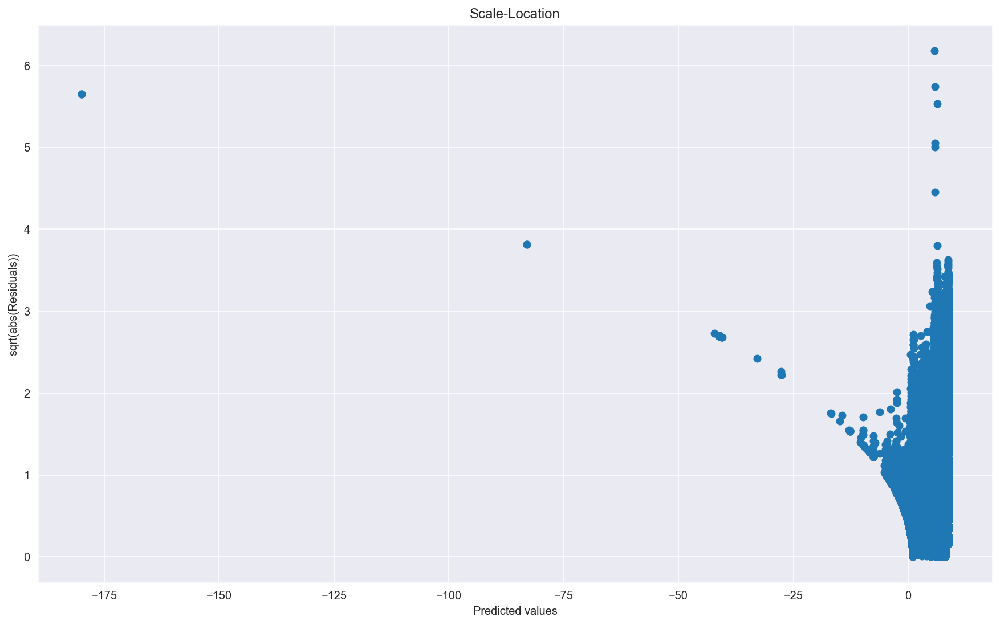

In [73]:
plt.title('Scale-Location')
plt.xlabel('Predicted values')
plt.ylabel('sqrt(abs(Residuals))')
plt.scatter(x=fitted_vals, y=np.sqrt(np.abs(resids_standardized)))
plt.show()

In [ ]:
bp_test = pd.DataFrame(sms.het_breuschpagan(resids, model.model.exog), 
                           columns=['value'],
                           index=['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'])

gq_test = pd.DataFrame(sms.het_goldfeldquandt(resids, model.model.exog)[:-1],
                           columns=['value'],
                           index=['F statistic', 'p-value'])

print('\n Breusch-Pagan test ----')
print(bp_test)
print('\n Goldfeld-Quandt test ----')
print(gq_test)
print('\n Residuals plots ----')

This assumption is important and not met

### &nbsp;&nbsp; f- Expectation (mean) of residuals is zero

In [72]:
lin_reg.resid.mean()

5.8043935222684696e-12

### Conclusion
We will only fit 
- a gamma model

## 4- Checking logistic regression assumptions

In [ ]:
#ranks that have the highest number of impressions = 1 

In [10]:
y_binary = np.where(y==1, 1, 0) #whether an advertiser ranks 1st (wins the auction)

In [21]:
predictor = ['avg_bid', 'clicks', 'day_of_week', 'day_of_month', 'month', 'click_through_rate',
       'keyword_79021a2e2c836c1a', 'keyword_cd74a8342d25d090',
       'keyword_3db691494440189b', 'keyword_aef4ee042bea9c6b', 'keyword_de84da9dfd5a336d',
       'keyword_remaining']

In [22]:
X_logit = train_df[predictor]

In [23]:
X_logit.head()

,avg_bid,clicks,day_of_week,day_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_de84da9dfd5a336d,keyword_remaining
23687697,500.0,0.0,1.0,16,3.0,0.0,0,1,0,0,0,0
17437538,600.0,0.0,4.0,22,2.0,0.0,1,0,0,0,0,0
37688585,1220.0,0.0,4.0,18,1.0,0.0,0,0,1,0,0,0
64712991,970.0,0.0,3.0,22,4.0,0.0,0,0,1,0,0,0
65287332,400.0,0.0,1.0,13,4.0,0.0,0,0,1,0,0,0


In [24]:
#fit model
logit_model = sm.Logit(y_binary,X_logit).fit(method='bfgs')

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/discrete/discrete_model.py:1789: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/discrete/discrete_model.py:1789: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))


         Current function value: 0.346480
         Iterations: 35
         Function evaluations: 50
         Gradient evaluations: 39


/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


We should not use the results from a logistic regression unless the parameter estimates have converged. 

We can increase the number of iterations allowed to see if they will converge, though usually, if the estimation doesn't converge within the default number (20 for the LOGISTIC REGRESSION procedure), it's quite possible convergence isn't going to be achieved by allowing more iterations. Inspection of the iterations history table may show that some estimates are growing larger though the log likelihood is stable, in which case a complete or quasi-complete separation is likely the issue. If this is the case, while the individual estimates are not valid (because finite estimates do not exist for such models), the predicted probabilities produced by the entire model can be used

In [25]:
logit_model.summary()

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:             45000000
Model:                          Logit   Df Residuals:                 44999989
Method:                           MLE   Df Model:                           10
Date:                Tue, 26 Nov 2019   Pseudo R-squ.:                 0.01748
Time:                        20:27:27   Log-Likelihood:            -1.5592e+07
converged:                      False   LL-Null:                   -1.5869e+07
Covariance Type:            nonrobust   LLR p-value:                     0.000
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
avg_bid                   6.757e-05        nan        nan        nan         nan         nan
clicks                       0.0484        nan        nan        nan         nan         nan
day_of_week                  0.0024        nan        nan        nan         nan         nan
day_of_month                 0.0002        nan        nan        nan         nan         nan
month                        0.0355        nan        nan        nan         nan         nan
click_through_rate           1.6495        nan        nan        nan         nan         nan
keyword_79021a2e2c836c1a    -2.3168        nan        nan        nan         nan         nan
keyword_cd74a8342d25d090    -1.9947        nan        nan        nan         nan         nan
keyword_3db691494440189b    -2.4104        nan        nan        nan         nan         nan
keyword_aef4ee042bea9c6b    -2.6575        nan        nan        nan         nan         nan
keyword_de84da9dfd5a336d    -2.0135        nan        nan        nan         nan         nan
keyword_remaining                 0        nan        nan        nan         nan         nan
============================================================================================
"""

Logistic regression assumptions:

- the observations to be independent of each other: the observations should not come from repeated measurements or matched data.

- little or no multicollinearity among the independent variables: independent variables should not be too highly correlated with each other.

- linearity of independent variables and log odds.  although this analysis does not require the dependent and independent variables to be related linearly, it requires that the independent variables are linearly related to the log odds

ASSUMPTION OF CONTINUOUS IVS BEING LINEARLY RELATED TO THE LOG ODDS

In [ ]:
#bidplot = sns.regplot(x= X['avg_bid'], y= y_binary, logistic= True).set_title(" Log Odds Linear Plot")

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning: divide by zero encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:890: RuntimeWarning: invalid value encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))


ASSUMPTION OF ABSENCE OF MULTICOLLINEARITY, explored before for linear regression

ASSUMPTION OF LACK OF OUTLIER:

In [ ]:
myboxplot = sns.boxplot(data= train_df[['avg_bid', 'click_through_rate']]).set_title("Bid and CTR")

In [ ]:
#https://www.datacamp.com/community/tutorials/understanding-logistic-regression-python

> Conclusion : We could not fit the logistic regression model because this model does not converge

maybe class imbalance? 

## 5- Building a Gamma model

#### We cannot build a linear model because our data does not satisfy the linear model assumptions
However here was some preliminary work

### &nbsp;&nbsp; a- normalize features

so that both variables be on the same scale. 

This enables us to meaningfully compare the magnitude of their respective beta coefficient to find out which of these two predictors contributes most to a high rank outcome.

In [74]:
scaler = MinMaxScaler() 
X_scaled = scaler.fit_transform(X)

In [75]:
print('means (features): ', X_scaled.mean(axis=0))
print('std (features): ', X_scaled.std(axis=0))

means (features):  [0.00101561 0.47637896 0.49980698 0.47809033 0.00295531 0.2812895
 0.25443575 0.2076685  0.1668495  0.09388175 0.        ]
std (features):  [0.00259379 0.33274446 0.29682071 0.38210756 0.02180658 0.44962842
 0.43554357 0.40563813 0.37284145 0.29166413 0.        ]


In [76]:
print('Min (features): ', X_scaled.min(axis=0))
print('Max (features): ', X_scaled.max(axis=0))

Min (features):  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Max (features):  [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.]


### &nbsp;&nbsp; b- fit model + accuracy

#### Ridge, then lasso

In [79]:
lin_train_df, lin_test_df = train_test_split(df, test_size=0.2, random_state = 5) #random_state for reproducability

In [80]:
ytrain_lin = lin_train_df['rank']

In [81]:
xtrain_lin = lin_train_df[predictor]

In [82]:
ytest_lin = lin_test_df['rank']

In [83]:
xtest_lin = lin_test_df[predictor]

In [86]:
ridgereg = Ridge(normalize=True)

In [87]:
ridgereg.fit(xtrain_lin,ytrain_lin)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None, normalize=True,
      random_state=None, solver='auto', tol=0.001)

In [ ]:
y_pred_ridge = ridgereg.predict(xtest_lin) 

In [ ]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred)) #adjusted r2
#print("Precision:",metrics.precision_score(y_test, y_pred))
#print("Recall:",metrics.recall_score(y_test, y_pred))

In [ ]:
#accuracy on test set, confusion matrix
# import the metrics class
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
cnf_matrix

In [ ]:
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [ ]:
y_pred_proba = logreg.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

### &nbsp;&nbsp; c- interpret feature importance : bid price vs CTR

In [ ]:
https://pythonfordatascience.org/logistic-regression-python/

In [ ]:
#barplot

### Building the Gamma model

In [5]:
lin_train_df, lin_test_df = train_test_split(train_df, test_size=0.2, random_state = 5) #random_state for reproducability

In [8]:
ytrain_lin = lin_train_df['rank']
xtrain_lin = lin_train_df[predictor]
ytest_lin = lin_test_df['rank']
xtest_lin = lin_test_df[predictor]

The Generalized Linear Model (GLM) for the Gamma distribution (glmGamma) is widely used in modeling continuous, non-negative and positive-skewed data, such as insurance claims and survival data

it's often suitable for data that are continuous, positive, right-skew and where variance is near-constant on the log-scal

In [9]:
gamma_model = sm.GLM( ytrain_lin,xtrain_lin, family=sm.families.Gamma()).fit() 

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/genmod/generalized_linear_model.py:273: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  DomainWarning)


In [10]:
gamma_model.summary()

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                   rank   No. Observations:              3200000
Model:                            GLM   Df Residuals:                  3199990
Model Family:                   Gamma   Df Model:                            9
Link Function:          inverse_power   Scale:                         0.71456
Method:                          IRLS   Log-Likelihood:            -9.0372e+06
Date:                Thu, 19 Dec 2019   Deviance:                   2.0351e+06
Time:                        10:55:52   Pearson chi2:                 2.29e+06
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
avg_bid                   5.685e-06   4.24e-08    133.934      0.000     5.6e-06    5.77e-06
day_of_week                  0.0005   3.46e-05     14.942      0.000       0.000       0.001
day_of_month             -4.312e-05   7.76e-06     -5.556      0.000   -5.83e-05   -2.79e-05
month                        0.0012   6.03e-05     20.208      0.000       0.001       0.001
click_through_rate           0.3162      0.002    152.605      0.000       0.312       0.320
keyword_79021a2e2c836c1a     0.1502      0.000    562.346      0.000       0.150       0.151
keyword_cd74a8342d25d090     0.1663      0.000    597.531      0.000       0.166       0.167
keyword_3db691494440189b     0.1187      0.000    459.979      0.000       0.118       0.119
keyword_aef4ee042bea9c6b     0.1024      0.000    359.466      0.000       0.102       0.103
keyword_de84da9dfd5a336d     0.1522      0.000    454.669      0.000       0.152       0.153
keyword_remaining                 0          0        nan        nan           0           0
============================================================================================
"""

avg_bid : 568,5000
click_through_rate : 0.31

In [11]:
fitted_vals_gamma = gamma_model.predict(xtest_lin)

#### When we normalize the features in the GLM gamma model:

In [12]:
scaler = MinMaxScaler() 
xtrain_lin_scaled = scaler.fit_transform(xtrain_lin)
xtest_lin_scaled = scaler.fit_transform(xtest_lin)

In [13]:
gamma_model_sc = sm.GLM( ytrain_lin , xtrain_lin_scaled, family=sm.families.Gamma()).fit() 

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/genmod/generalized_linear_model.py:273: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  DomainWarning)


In [15]:
xtrain_lin.head()

,avg_bid,day_of_week,day_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_de84da9dfd5a336d,keyword_remaining
66275423,400.0,2.0,23,1.0,0.0,0,0,0,0,1,0
67007056,650.0,7.0,21,1.0,0.0,0,1,0,0,0,0
15032059,150.0,1.0,29,1.0,0.0,0,1,0,0,0,0
41208481,260.0,1.0,20,4.0,0.0,1,0,0,0,0,0
2399036,2370.0,4.0,18,1.0,0.0,0,0,0,1,0,0


In [14]:
gamma_model_sc.summary()

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/statsmodels/base/model.py:1294: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:901: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1892: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                   rank   No. Observations:              3200000
Model:                            GLM   Df Residuals:                  3199990
Model Family:                   Gamma   Df Model:                            9
Link Function:          inverse_power   Scale:                         0.71460
Method:                          IRLS   Log-Likelihood:            -9.0374e+06
Date:                Thu, 19 Dec 2019   Deviance:                   2.0352e+06
Time:                        11:04:43   Pearson chi2:                 2.29e+06
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             5.6861      0.042    133.950      0.000       5.603       5.769
x2             0.0028      0.000     13.407      0.000       0.002       0.003
x3            -0.0013      0.000     -5.406      0.000      -0.002      -0.001
x4             0.0032      0.000     17.436      0.000       0.003       0.004
x5             1.2649      0.008    152.610      0.000       1.249       1.281
x6             0.1525      0.000    679.102      0.000       0.152       0.153
x7             0.1686      0.000    707.349      0.000       0.168       0.169
x8             0.1209      0.000    560.841      0.000       0.121       0.121
x9             0.1046      0.000    426.219      0.000       0.104       0.105
x10            0.1544      0.000    511.486      0.000       0.154       0.155
const               0          0        nan        nan           0           0
==============================================================================
"""

In [16]:
fitted_vals_gam = gamma_model_sc.predict(xtest_lin_scaled)

In [24]:
resid_gamma = gamma_model_sc.df_resid #not this function to find residual 

In [ ]:
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Residual values')
plt.scatter(x=fitted_vals_gam, y=resid_gamma)
plt.show()

## 6- Building a decision tree model

### a- Regression tree

In [26]:
predictor = ['avg_bid', 'day_of_week', 'day_of_month', 'month', 'click_through_rate',
       'keyword_79021a2e2c836c1a', 'keyword_cd74a8342d25d090',
       'keyword_3db691494440189b', 'keyword_aef4ee042bea9c6b', 'keyword_de84da9dfd5a336d',
       'keyword_remaining']

In [62]:
X_train = sub_train_df[predictor]

In [63]:
y_train = sub_train_df['rank']

In [60]:
X_test = sub_test_df[predictor]

In [61]:
y_test = sub_test_df['rank']

In [ ]:
#about 0.11 accuracy without tuning the model

In [ ]:
#ref: https://www.datacamp.com/community/tutorials/decision-tree-classification-python

In [93]:
parameters = {'min_samples_split': range(10,500,20),'max_depth': range(1,25,2)}
clf_tree = DecisionTreeClassifier()
clf = GridSearchCV(clf_tree, parameters)

In [94]:
clf = clf.fit(X_train,y_train) #or smaller sample 

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/sklearn/model_selection/_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)


In [101]:
y_pred = clf.predict(X_test)

In [99]:
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.1279015


In [105]:
clf.best_params_

{'max_depth': 13, 'min_samples_split': 490}

In [ ]:
# tuning/ ref:https://medium.com/@mohtedibf/indepth-parameter-tuning-for-decision-tree-6753118a03c3

In [107]:
parameters = {'min_samples_split': [500, 1000, 3000, 5000, 10000, 30000],
              'max_depth': [5,15,30,50,80,100]}
clf_tree = DecisionTreeClassifier()
clf = GridSearchCV(clf_tree, parameters)

In [108]:
clf2 = clf.fit(X_train,y_train)

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/sklearn/model_selection/_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)


In [109]:
y_pred = clf2.predict(X_test)

In [110]:
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.128085


In [111]:
clf2.best_params_

{'max_depth': 15, 'min_samples_split': 30000}

In [112]:
parameters = {'min_samples_split': [30000,50000,100000, 150000],
              'max_depth': [5,15,30,50,80]}
clf_tree = DecisionTreeClassifier()
clf = GridSearchCV(clf_tree, parameters)

In [113]:
clf3 = clf.fit(X_train,y_train)

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/sklearn/model_selection/_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)


In [116]:
y_pred = clf3.predict(X_test)

In [117]:
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.1280845


In [133]:
clf3.best_params_

{'max_depth': 15, 'min_samples_split': 30000}

In [134]:
clf3 = DecisionTreeClassifier(min_samples_split=30000, max_depth=15)

In [136]:
clf3 = clf3.fit(X_train,y_train)

In [ ]:
#visualizing the decision tree

In [139]:
listranks = list(df['rank'].unique())

In [140]:
listranks_str = []
for rank in listranks:
    listranks_str.append(str(rank))

In [144]:
dot_data = StringIO()
export_graphviz(clf3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = predictor,class_names=listranks_str)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('dtree.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.310103 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.310103 to fit



In [ ]:
#trying a dtree with less depth and number of leaves to fit for viz

In [145]:
clf4 = DecisionTreeClassifier(min_samples_split=30000, max_depth = 5)

In [146]:
clf4 = clf4.fit(X_train,y_train)

In [150]:
y_pred = clf4.predict(X_test)

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Observed vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Observed values')
plt.scatter(x=y_pred, y=y_test)
plt.show()

In [151]:
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.124946


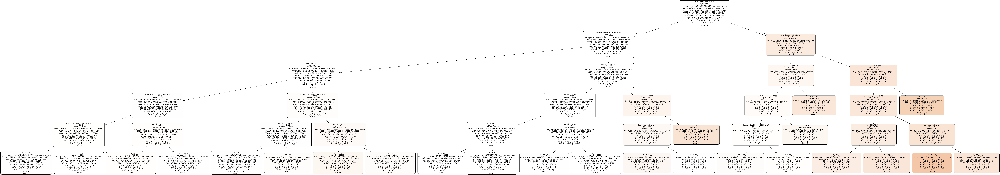

In [147]:
dot_data = StringIO()
export_graphviz(clf4, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = predictor,class_names=listranks_str)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('dtree.png')
Image(graph.create_png())

In [222]:
#feature importance
for name, importance in zip(X_train.columns, clf4.feature_importances_):
    print( name , ' : ' , importance)

avg_bid  :  0.2254471100547014
day_of_week  :  0.0
day_of_month  :  0.0
month  :  0.0
click_through_rate  :  0.5699890671151546
keyword_79021a2e2c836c1a  :  0.01249065337139443
keyword_cd74a8342d25d090  :  0.07770553929808474
keyword_3db691494440189b  :  0.10947410345288201
keyword_aef4ee042bea9c6b  :  0.0
keyword_de84da9dfd5a336d  :  0.004893526707782756
keyword_remaining  :  0.0


#### On subsample of 4 millions samples

In [27]:
clf4bis = DecisionTreeClassifier(min_samples_split=30000, max_depth = 5)

In [28]:
clf4bis = clf4bis.fit(xtrain_lin,ytrain_lin)

In [29]:
y_pred4bis = clf4bis.predict(xtest_lin)

In [31]:
print("Accuracy:", metrics.accuracy_score(ytest_lin, y_pred4bis))

Accuracy: 0.1254225


Same accuracy as smaller subsample splitted intro train and test

### b- Classification tree

In [154]:
y_binary_train = np.where(y_train==1, 1, 0)

In [155]:
y_binary_test = np.where(y_test==1, 1, 0)

In [156]:
clf5 = DecisionTreeClassifier(min_samples_split=30000, max_depth = 5)

In [157]:
clf5 = clf5.fit(X_train,y_binary_train)

In [158]:
y_pred = clf5.predict(X_test)

In [159]:
print("Accuracy:", metrics.accuracy_score(y_binary_test, y_pred))

Accuracy: 0.887639


In [221]:
#accuracy is very high because we have an unbalanced dataset (many samples do not win (rank 1st))

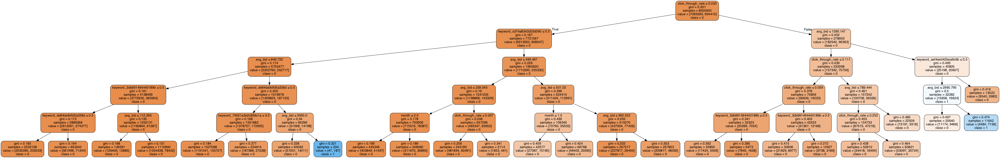

In [163]:
dot_data = StringIO()
export_graphviz(clf5, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = predictor, class_names = ['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('dtree_binary.png')
Image(graph.create_png())

In [220]:
#feature importance
for name, importance in zip(X_train.columns, clf5.feature_importances_):
    print( name , ' : ' , importance)

avg_bid  :  0.2732732500895223
day_of_week  :  0.0
day_of_month  :  0.0
month  :  0.0035434734719366557
click_through_rate  :  0.5735486116853332
keyword_79021a2e2c836c1a  :  0.027159017156290426
keyword_cd74a8342d25d090  :  0.05897904385343105
keyword_3db691494440189b  :  0.01670223727028995
keyword_aef4ee042bea9c6b  :  0.01625360188692226
keyword_de84da9dfd5a336d  :  0.030540764586274215
keyword_remaining  :  0.0


Let's try to undersample samples which do not win to rebalance the dataset

In [168]:
Counter(y_binary_train).keys() # equals to list(set(words))

dict_keys([0, 1])

In [169]:
Counter(y_binary_train).values() # counts the elements' frequency

dict_values([7095590, 904410])

In [195]:
X_train['outcome'] = list(y_binary_train)

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [197]:
zero = X_train.loc[X_train['outcome'] == 0]

In [199]:
one = X_train.loc[X_train['outcome'] == 1]

In [198]:
zero_sample = zero.sample(n=904410, random_state = 5)

In [203]:
full_undersampled_train_df = zero_sample.append(one)

In [204]:
y_binary_undersampled = full_undersampled_train_df['outcome']

In [207]:
X_train_undersample = full_undersampled_train_df.drop('outcome', 1)

In [208]:
Counter(y_binary_undersampled).values() #successful undersampling

dict_values([904410, 904410])

In [ ]:
#alternative way to undersample
sampler = RandomUnderSampler(ratio={0: 904410, 1: 904410})
X_rs, y_rs = sampler.fit_sample(X_train, y_binary_train)
#print('Random undersampling {}'.format(Counter(y_rs)))
#plot_this(X_rs,y_rs,'Random undersampling')

In [209]:
clf6 = DecisionTreeClassifier(min_samples_split=30000, max_depth = 5)

In [210]:
clf6 = clf6.fit(X_train_undersample,y_binary_undersampled)

In [211]:
y_pred = clf6.predict(X_test)

In [212]:
print("Accuracy:", metrics.accuracy_score(y_binary_test, y_pred))

Accuracy: 0.7738235


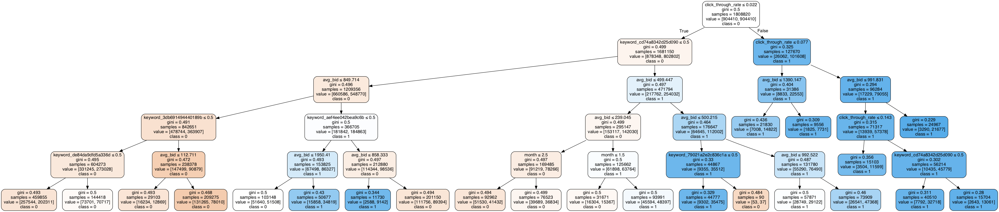

In [213]:
dot_data = StringIO()
export_graphviz(clf6, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = predictor, class_names = ['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('dtree_binary_balanced_data.png')
Image(graph.create_png())

In [219]:
#feature importance
for name, importance in zip(X_train_undersample.columns, clf6.feature_importances_):
    print( name , ' : ' , importance)

avg_bid  :  0.3467229269837633
day_of_week  :  0.0
day_of_month  :  0.0
month  :  0.002885845903665136
click_through_rate  :  0.47788530494696513
keyword_79021a2e2c836c1a  :  0.0005070200440475378
keyword_cd74a8342d25d090  :  0.09479193550696711
keyword_3db691494440189b  :  0.03309808157699987
keyword_aef4ee042bea9c6b  :  0.03355038559009514
keyword_de84da9dfd5a336d  :  0.01055849944749672
keyword_remaining  :  0.0


In [ ]:
#gridsearch on balanced dataset:

In [227]:
parameters = {'min_samples_split': [500, 1000, 3000, 10000],
              'max_depth': [5,15,30,50,80]}
clf_tree = DecisionTreeClassifier()
clf = GridSearchCV(clf_tree, parameters)

In [228]:
clf7 = clf.fit(X_train_undersample,y_binary_undersampled)

/Users/estelledanilo/miniconda3/envs/mythesis/lib/python3.6/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


In [229]:
y_pred = clf7.predict(X_test)

In [230]:
clf7.best_params_

{'max_depth': 15, 'min_samples_split': 3000}

In [231]:
print("Accuracy:", metrics.accuracy_score(y_binary_test, y_pred))

Accuracy: 0.708175


In [15]:
#Last optimal classifier: 

In [233]:
clf8 = DecisionTreeClassifier(min_samples_split=3000, max_depth = 5)

In [234]:
clf8 = clf8.fit(X_train_undersample,y_binary_undersampled)

In [ ]:
y_pred = clf8.predict(X_test)

In [ ]:
print("Accuracy:", metrics.accuracy_score(y_binary_test, y_pred))

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)
plt.title('Observed vs. Predicted Values')
plt.xlabel('Predicted values')
plt.ylabel('Observed values')
plt.scatter(x=y_pred, y=y_test)
plt.show()

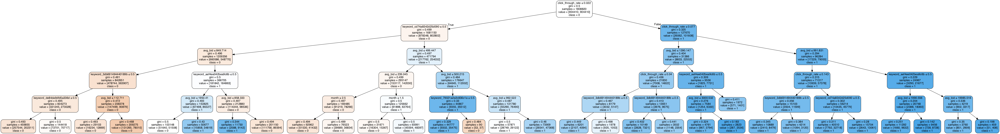

In [235]:
dot_data = StringIO()
export_graphviz(clf8, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = predictor, class_names = ['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('dtree_binary_balanced_data_grid.png')
Image(graph.create_png())

In [236]:
#feature importance
for name, importance in zip(X_train_undersample.columns, clf8.feature_importances_):
    print( name , ' : ' , importance)

avg_bid  :  0.3462718207390319
day_of_week  :  0.0
day_of_month  :  0.0
month  :  0.002866383526029062
click_through_rate  :  0.4759082677424521
keyword_79021a2e2c836c1a  :  0.000503600659958533
keyword_cd74a8342d25d090  :  0.09415265104505323
keyword_3db691494440189b  :  0.03423584661746811
keyword_aef4ee042bea9c6b  :  0.035574137594759934
keyword_de84da9dfd5a336d  :  0.010487292075247052
keyword_remaining  :  0.0


In [ ]:
#backup data from previous steps

In [119]:
df.to_pickle("/Users/estelledanilo/Desktop/Thesis3.6/fulldf") #backup data from previous steps

ERROR! Session/line number was not unique in database. History logging moved to new session 58


In [ ]:
df = pd.read_pickle("/Users/estelledanilo/Desktop/Thesis3.6/fulldf")

## 7- Appendix 

#### 2 Prelimary analysis of the data to understand/reverse engineer the rule of auctions:

- What is the rank of bidders who received the highest impressions (number of ads displayed to users)?

Finding the range of unique impressions:

In [237]:
uniqueimp = df['impressions'].astype(int).unique()
uniqueimp.sort()
print(uniqueimp)

[      1       2       3 ...  843176  900947 1259886]


In [247]:
highestimp = list(uniqueimp[-10:])
highestimp

[542516,
 612368,
 624164,
 631985,
 644619,
 663079,
 681771,
 843176,
 900947,
 1259886]

Bidders with highest impressions printed below rank 1st, which makes sense: the higher a bidder ranks, the most impressions(the more of their ads) should be served to users.

In [238]:
df.loc[df['impressions'].isin([843176,900947,1259886])]

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_fc4f04e287746c48,keyword_de84da9dfd5a336d,keyword_remaining
34438633,33,129fe1f2-0107-47a2-9530-c67683970caf,1,79021a2e2c836c1a,"4,429","843,176",212,5,2,1,2,0,1,0,0,0,0,0,0
34439546,39,129fe1f2-0107-47a2-9530-c67683970caf,1,79021a2e2c836c1a,"4,430","1,259,886",41,4,8,2,2,0,1,0,0,0,0,0,0
77550996,19,7a3d1267-2389-4ffa-ad05-5764f97f637a,1,79021a2e2c836c1a,"8,153","900,947",24,5,19,3,1,0,1,0,0,0,0,0,0


but not generalizable for top 10 impressions:

In [249]:
df.loc[df['impressions'].isin(highestimp)]

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_fc4f04e287746c48,keyword_de84da9dfd5a336d,keyword_remaining
5137280,48,1b666405-7883-4294-9d05-fffd3deceac4,3,aef4ee042bea9c6b fc4f04e287746c48,"22,989","542,516",3,6,17,3,2,0,0,0,0,1,1,0,0
34438633,33,129fe1f2-0107-47a2-9530-c67683970caf,1,79021a2e2c836c1a,"4,429","843,176",212,5,2,1,2,0,1,0,0,0,0,0,0
34439546,39,129fe1f2-0107-47a2-9530-c67683970caf,1,79021a2e2c836c1a,"4,430","1,259,886",41,4,8,2,2,0,1,0,0,0,0,0,0
37700639,19,f46de54a-a18c-4f05-9e7b-715e8fef8a46,2,79021a2e2c836c1a,"3,510","681,771",63,5,19,3,1,0,1,0,0,0,0,0,0
41993549,55,c91921f9-3baf-48a1-8e4e-5ff66d698e31,1,aef4ee042bea9c6b ac26bfe54a8a8f38 fc4f04e28774...,"28,415","663,079",54,6,24,4,2,0,0,0,0,1,1,0,0
55127861,39,ee5ff192-7a36-4b0c-95bf-c3267b62e73d,2,79021a2e2c836c1a,"3,205","644,619",56,4,8,2,2,0,1,0,0,0,0,0,0
57521755,39,4c4c6ec5-4a76-4f29-8118-e9b839819998,3,79021a2e2c836c1a,"3,000","631,985",69,4,8,2,2,0,1,0,0,0,0,0,0
61118836,39,e541804c-cf17-4561-bb0f-5ae0680a21f5,4,79021a2e2c836c1a,"3,000","612,368",21,4,8,2,2,0,1,0,0,0,0,0,0
74473884,62,02db254f-850a-484f-9511-6c49d839367e,1,aef4ee042bea9c6b ac26bfe54a8a8f38 fc4f04e28774...,"24,901","624,164",23,6,0,1,3,0,0,0,0,1,1,0,0
77550996,19,7a3d1267-2389-4ffa-ad05-5764f97f637a,1,79021a2e2c836c1a,"8,153","900,947",24,5,19,3,1,0,1,0,0,0,0,0,0


- On a given day (day 18), can the same bidder be ranked differently for the same auction keywords? Yes: ranking 4 and 5. 

In [239]:
df.loc[ (df['account_id'] == '08bade48-1081-488f-b459-6c75d75312ae') & (df['day'] == 18) 
       & (df['five_keywords']== '2affa525151b6c51 79021a2e2c836c1a 327e089362aac70c fca90e7f73f3c8ef af26d27737af376a') ]

,day,account_id,rank,five_keywords,avg_bid,impressions,clicks,day_of_week,day_of_month,week_of_month,month,click_through_rate,keyword_79021a2e2c836c1a,keyword_cd74a8342d25d090,keyword_3db691494440189b,keyword_aef4ee042bea9c6b,keyword_fc4f04e287746c48,keyword_de84da9dfd5a336d,keyword_remaining
22,18,08bade48-1081-488f-b459-6c75d75312ae,4,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,2,0,4,18,3,1,0,1,0,0,0,0,0,0
55,18,08bade48-1081-488f-b459-6c75d75312ae,5,2affa525151b6c51 79021a2e2c836c1a 327e089362aa...,100,1,0,4,18,3,1,0,1,0,0,0,0,0,0
